In [1]:
# from google.colab import drive
# drive.mount('/content/MyDrive/')

Data Import and Preparation

In [1]:
import pandas as pd
import numpy as np
import math
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

Import data

In [2]:
train = pd.read_csv('./train.csv')
test = pd.read_csv('./test.csv')

In [3]:
print(train.shape)
print(test.shape)

(27321, 80)
(11709, 80)


In [4]:
train.head()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,NaN,140,53,36,New York,NY,Hamilton,Hamilton,City,...,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,NaN,140,141,18,Indiana,IN,South Bend,Roseland,City,...,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,NaN,140,63,18,Indiana,IN,Danville,Danville,City,...,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,NaN,140,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,...,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,NaN,140,161,20,Kansas,KS,Manhattan,Manhattan City,City,...,24.17693,21.58333,11.10484,1854.48652,3051.0,0.13046,0.12356,0.00000,0.00000,0.03109


In [5]:
test.head()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,255504,NaN,140,163,26,Michigan,MI,Detroit,Dearborn Heights City,CDP,...,34.78682,33.75000,21.58531,416.48097,1938.0,0.70252,0.28217,0.05910,0.03813,0.14299
1,252676,NaN,140,1,23,Maine,ME,Auburn,Auburn City,City,...,44.23451,46.66667,22.37036,532.03505,1950.0,0.85128,0.64221,0.02338,0.00000,0.13377
2,276314,NaN,140,15,42,Pennsylvania,PA,Pine City,Millerton,Borough,...,41.62426,44.50000,22.86213,453.11959,1879.0,0.81897,0.59961,0.01746,0.01358,0.10026
3,248614,NaN,140,231,21,Kentucky,KY,Monticello,Monticello City,City,...,44.81200,48.00000,21.03155,263.94320,1081.0,0.84609,0.56953,0.05492,0.04694,0.12489
4,286865,NaN,140,355,48,Texas,TX,Corpus Christi,Edroy,Town,...,40.66618,42.66667,21.30900,709.90829,2956.0,0.79077,0.57620,0.01726,0.00588,0.16379


In [6]:
train.describe()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
count,27321.000000,0.0,27321.0,27321.000000,27321.000000,27321.000000,27321.000000,27321.000000,27321.000000,2.732100e+04,...,27115.000000,27115.000000,27115.000000,27115.000000,27115.000000,27053.000000,27130.000000,27130.000000,27130.000000,27130.000000
mean,257331.996303,NaN,140.0,85.646426,28.271806,50081.999524,596.507668,37.508813,-91.288394,1.295106e+08,...,40.319803,40.355099,22.178745,544.238432,2208.761903,0.640434,0.508300,0.047537,0.019089,0.100248
std,21343.859725,NaN,0.0,98.333097,16.392846,29558.115660,232.497482,5.588268,16.343816,1.275531e+09,...,5.886317,8.039585,2.540257,283.546896,1089.316999,0.226640,0.136860,0.037640,0.020796,0.049055
min,220342.000000,NaN,140.0,1.000000,1.000000,602.000000,201.000000,17.929085,-165.453872,4.113400e+04,...,16.008330,13.250000,0.556780,0.664700,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,238816.000000,NaN,140.0,29.000000,13.000000,26554.000000,405.000000,33.899064,-97.816067,1.799408e+06,...,36.892050,34.916670,21.312135,355.995825,1471.000000,0.502780,0.425102,0.020810,0.004530,0.065800
50%,257220.000000,NaN,140.0,63.000000,28.000000,47715.000000,614.000000,38.755183,-86.554374,4.866940e+06,...,40.373320,40.583330,22.514410,503.643890,2066.000000,0.690840,0.526665,0.038840,0.013460,0.095205
75%,275818.000000,NaN,140.0,109.000000,42.000000,77093.000000,801.000000,41.380606,-79.782503,3.359820e+07,...,43.567120,45.416670,23.575260,680.275055,2772.000000,0.817460,0.605760,0.065100,0.027488,0.129000
max,294334.000000,NaN,140.0,840.000000,72.000000,99925.000000,989.000000,67.074017,-65.379332,1.039510e+11,...,79.837390,82.250000,30.241270,6197.995200,27250.000000,1.000000,1.000000,0.714290,0.714290,1.000000


In [7]:
test.describe()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
count,11709.000000,0.0,11709.0,11709.000000,11709.000000,11709.000000,11709.000000,11709.000000,11709.000000,1.170900e+04,...,11613.000000,11613.000000,11613.000000,11613.000000,11613.000000,11587.000000,11625.000000,11625.000000,11625.000000,11625.000000
mean,257525.004783,NaN,140.0,85.710650,28.489196,50123.418396,593.598514,37.405491,-91.340229,1.095500e+08,...,40.111999,40.131864,22.148145,550.411243,2233.003186,0.634194,0.505632,0.047960,0.019346,0.099191
std,21466.372658,NaN,0.0,99.304334,16.607262,29775.134038,232.074263,5.625904,16.407818,7.624940e+08,...,5.851192,7.972026,2.554907,280.992521,1072.017063,0.232232,0.139774,0.038693,0.021428,0.048525
min,220336.000000,NaN,140.0,1.000000,1.000000,601.000000,201.000000,17.965835,-166.770979,8.299000e+03,...,15.360240,12.833330,0.737110,0.251910,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,238819.000000,NaN,140.0,29.000000,13.000000,25570.000000,404.000000,33.919813,-97.816561,1.718660e+06,...,36.729210,34.750000,21.270920,363.225840,1499.000000,0.492500,0.422020,0.020890,0.004500,0.064590
50%,257651.000000,NaN,140.0,61.000000,28.000000,47362.000000,612.000000,38.618093,-86.643344,4.835000e+06,...,40.196960,40.333330,22.472990,509.103610,2099.000000,0.687640,0.525270,0.038680,0.013870,0.094350
75%,276300.000000,NaN,140.0,109.000000,42.000000,77406.000000,787.000000,41.232973,-79.697311,3.204540e+07,...,43.496490,45.333330,23.549450,685.883910,2800.000000,0.815235,0.605660,0.065340,0.027910,0.128400
max,294333.000000,NaN,140.0,810.000000,72.000000,99929.000000,989.000000,64.804269,-65.695344,5.520166e+10,...,90.107940,90.166670,29.626680,4145.557870,15466.000000,1.000000,1.000000,0.714290,0.714290,0.362750


In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27321 entries, 0 to 27320
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          27321 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     27321 non-null  int64  
 3   COUNTYID                     27321 non-null  int64  
 4   STATEID                      27321 non-null  int64  
 5   state                        27321 non-null  object 
 6   state_ab                     27321 non-null  object 
 7   city                         27321 non-null  object 
 8   place                        27321 non-null  object 
 9   type                         27321 non-null  object 
 10  primary                      27321 non-null  object 
 11  zip_code                     27321 non-null  int64  
 12  area_code                    27321 non-null  int64  
 13  lat             

In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11709 entries, 0 to 11708
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          11709 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     11709 non-null  int64  
 3   COUNTYID                     11709 non-null  int64  
 4   STATEID                      11709 non-null  int64  
 5   state                        11709 non-null  object 
 6   state_ab                     11709 non-null  object 
 7   city                         11709 non-null  object 
 8   place                        11709 non-null  object 
 9   type                         11709 non-null  object 
 10  primary                      11709 non-null  object 
 11  zip_code                     11709 non-null  int64  
 12  area_code                    11709 non-null  int64  
 13  lat             

Figure out the primary key and look for the requirement of indexing

In [10]:
train.set_index(keys=['UID'],inplace=True)
test.set_index(keys=['UID'],inplace=True)


Gauge the fill rate of the variables and devise plans for missing value treatment. Please explain explicitly the reason for the treatment chosen for each variable.

In [11]:
missing_train_values = round(train.isnull().sum()*100/len(train),2)
missing_train_values_t = pd.DataFrame(missing_train_values,columns=['Percentage_of_missing_values'])
missing_train_values_t.sort_values(by=['Percentage_of_missing_values'],inplace=True,ascending=False)

In [12]:
missing_train_values_t[missing_train_values_t['Percentage_of_missing_values']>0]

,Percentage_of_missing_values
BLOCKID,100.00
hc_samples,2.20
hc_mean,2.20
hc_median,2.20
hc_stdev,2.20
hc_sample_weight,2.20
hc_mortgage_mean,2.10
hc_mortgage_stdev,2.10
hc_mortgage_sample_weight,2.10
hc_mortgage_samples,2.10


In [13]:
missing_test_values = round(test.isnull().sum()*100/len(test),2)
missing_test_values_t = pd.DataFrame(missing_test_values,columns=['Percentage_of_missing_values'])
missing_test_values_t.sort_values(by=['Percentage_of_missing_values'],inplace=True,ascending=False)

In [14]:
 missing_test_values_t[missing_test_values_t['Percentage_of_missing_values']>0]

,Percentage_of_missing_values
BLOCKID,100.00
hc_samples,2.48
hc_mean,2.48
hc_median,2.48
hc_stdev,2.48
hc_sample_weight,2.48
hc_mortgage_mean,2.29
hc_mortgage_stdev,2.29
hc_mortgage_sample_weight,2.29
hc_mortgage_samples,2.29


BLOCKID can be dropped, since it is 100%missing values

In [15]:
train.var()==0

BLOCKID        False
SUMLEVEL        True
COUNTYID       False
STATEID        False
zip_code       False
               ...  
pct_own        False
married        False
married_snp    False
separated      False
divorced       False
Length: 73, dtype: bool

SUMLEVEL can be dropped due to no variance

In [16]:
train.drop(columns=['BLOCKID','SUMLEVEL'],inplace=True)
test.drop(columns=['BLOCKID','SUMLEVEL'],inplace=True)

In [17]:
for column in train:
  if train[column].dtype == 'object':
    print(f'{column}: {train[column].isnull().sum()}') # Object column doesn't have any null values

state: 0
state_ab: 0
city: 0
place: 0
type: 0
primary: 0


In [18]:
for column in train:
  if train[column].dtype != 'object':
    print(f'{column}: {train[column].isnull().sum()}')# numerical column contains null values

COUNTYID: 0
STATEID: 0
zip_code: 0
area_code: 0
lat: 0
lng: 0
ALand: 0
AWater: 0
pop: 0
male_pop: 0
female_pop: 0
rent_mean: 314
rent_median: 314
rent_stdev: 314
rent_sample_weight: 314
rent_samples: 314
rent_gt_10: 314
rent_gt_15: 314
rent_gt_20: 314
rent_gt_25: 314
rent_gt_30: 314
rent_gt_35: 314
rent_gt_40: 314
rent_gt_50: 314
universe_samples: 0
used_samples: 0
hi_mean: 268
hi_median: 268
hi_stdev: 268
hi_sample_weight: 268
hi_samples: 268
family_mean: 298
family_median: 298
family_stdev: 298
family_sample_weight: 298
family_samples: 298
hc_mortgage_mean: 573
hc_mortgage_median: 573
hc_mortgage_stdev: 573
hc_mortgage_sample_weight: 573
hc_mortgage_samples: 573
hc_mean: 600
hc_median: 600
hc_stdev: 600
hc_samples: 600
hc_sample_weight: 600
home_equity_second_mortgage: 457
second_mortgage: 457
home_equity: 457
debt: 457
second_mortgage_cdf: 457
home_equity_cdf: 457
debt_cdf: 457
hs_degree: 190
hs_degree_male: 200
hs_degree_female: 223
male_age_mean: 189
male_age_median: 189
male_age_

In [19]:
for column in test:
  if test[column].dtype == 'object':
    print(f'{column}: {test[column].isnull().sum()}') # Object column doesn't have any null values

state: 0
state_ab: 0
city: 0
place: 0
type: 0
primary: 0


In [20]:
for column in test:
  if test[column].dtype != 'object':
    print(f'{column}: {test[column].isnull().sum()}')#numerical column contains null values

COUNTYID: 0
STATEID: 0
zip_code: 0
area_code: 0
lat: 0
lng: 0
ALand: 0
AWater: 0
pop: 0
male_pop: 0
female_pop: 0
rent_mean: 148
rent_median: 148
rent_stdev: 148
rent_sample_weight: 148
rent_samples: 148
rent_gt_10: 149
rent_gt_15: 149
rent_gt_20: 149
rent_gt_25: 149
rent_gt_30: 149
rent_gt_35: 149
rent_gt_40: 149
rent_gt_50: 149
universe_samples: 0
used_samples: 0
hi_mean: 122
hi_median: 122
hi_stdev: 122
hi_sample_weight: 122
hi_samples: 122
family_mean: 136
family_median: 136
family_stdev: 136
family_sample_weight: 136
family_samples: 136
hc_mortgage_mean: 268
hc_mortgage_median: 268
hc_mortgage_stdev: 268
hc_mortgage_sample_weight: 268
hc_mortgage_samples: 268
hc_mean: 290
hc_median: 290
hc_stdev: 290
hc_samples: 290
hc_sample_weight: 290
home_equity_second_mortgage: 220
second_mortgage: 220
home_equity: 220
debt: 220
second_mortgage_cdf: 220
home_equity_cdf: 220
debt_cdf: 220
hs_degree: 85
hs_degree_male: 89
hs_degree_female: 105
male_age_mean: 84
male_age_median: 84
male_age_stde

Deleting the rows which contain null values.Because most of the column null values percentage are not higher than 2.5%.So it's safe to delete these rows



In [21]:
train.dropna(inplace=True)

In [22]:
train.isnull().any().sum()

0

In [23]:
train.shape

(26585, 77)

In [24]:
test.dropna(inplace=True)

In [25]:
test.isnull().any().sum()

0

In [26]:
test.shape

(11355, 77)

# Exploratory Data Analysis(EDA)

### Perform debt analysis. You may take the following steps:

 a) Explore the top 2,500 locations where the percentage of households with a second mortgage is the highest and percent ownership is above 10 percent. Visualize using geo-map. You may keep the upper limit for the percent of households with a second mortgage to 50 percent

In [27]:
train.nlargest(2500, ['second_mortgage', 'pct_own'])

,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
UID,,,,,,,,,,,,,,,,,,,,,
264403,31,34,New Jersey,NJ,Passaic,Garfield City,City,tract,7055,973,...,26.57222,25.66667,19.34716,553.14428,2526.0,0.01157,0.32288,0.04792,0.00913,0.04678
289712,147,51,Virginia,VA,Farmville,Farmville,Town,tract,23901,434,...,19.58762,19.16667,4.00258,673.39577,1124.0,0.62069,0.03612,0.01806,0.01806,0.00000
222830,13,4,Arizona,AZ,Scottsdale,Tempe City,CDP,tract,85257,480,...,31.91429,30.83333,14.45269,229.39846,981.0,0.05660,0.21531,0.10204,0.07347,0.20816
251185,27,25,Massachusetts,MA,Worcester,Worcester City,City,tract,1610,508,...,30.60147,26.16667,19.21553,262.09529,994.0,0.20247,0.37844,0.11976,0.09341,0.10539
278178,101,42,Pennsylvania,PA,Philadelphia,Millbourne,Borough,tract,19104,215,...,22.42708,21.08333,7.39823,2280.04214,3446.0,0.05041,0.07505,0.03665,0.00000,0.01378
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245335,3,18,Indiana,IN,Fort Wayne,Fort Wayne City,City,tract,46814,260,...,36.26617,37.66667,22.54754,750.45868,3351.0,0.87611,0.85458,0.00632,0.00632,0.01370
260417,81,37,North Carolina,NC,High Point,Jamestown,Village,tract,27265,336,...,37.43896,35.00000,21.50541,449.31863,2081.0,0.44992,0.56118,0.11224,0.03118,0.03897
286364,257,48,Texas,TX,Crandall,Talty,Town,tract,75114,972,...,32.84647,32.75000,20.34275,965.04813,4358.0,0.89705,0.64629,0.02629,0.01131,0.05564


In [28]:
train_2500 = train[['state','lat','lng','second_mortgage', 'pct_own', 'place', 'state', 'city', 'COUNTYID', 'STATEID', 'home_equity','home_equity_second_mortgage','debt','hi_median','family_median']].nlargest(2500, ['second_mortgage', 'pct_own'])

In [29]:
train_2500

,state,lat,lng,second_mortgage,pct_own,place,state,city,COUNTYID,STATEID,home_equity,home_equity_second_mortgage,debt,hi_median,family_median
UID,,,,,,,,,,,,,,,
264403,New Jersey,40.867944,-74.114633,0.60870,0.01157,Garfield City,New Jersey,Passaic,31,34,0.00000,0.00000,0.60870,28053.0,29340.0
289712,Virginia,37.297357,-78.396452,0.50000,0.62069,Farmville,Virginia,Farmville,147,51,0.00000,0.00000,0.50000,23236.0,59954.0
222830,Arizona,33.458658,-111.955104,0.43750,0.05660,Tempe City,Arizona,Scottsdale,13,4,0.43750,0.43750,0.54688,40883.0,59657.0
251185,Massachusetts,42.254262,-71.800347,0.43363,0.20247,Worcester City,Massachusetts,Worcester,27,25,0.43363,0.43363,0.84956,29037.0,40476.0
278178,Pennsylvania,39.952954,-75.202767,0.39024,0.05041,Millbourne,Pennsylvania,Philadelphia,101,42,0.21951,0.00000,0.93902,12881.0,50622.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245335,Indiana,41.074478,-85.305983,0.06880,0.87611,Fort Wayne City,Indiana,Fort Wayne,3,18,0.17017,0.06880,0.79569,104418.0,111437.0
260417,North Carolina,36.049499,-79.950157,0.06880,0.44992,Jamestown,North Carolina,High Point,81,37,0.10558,0.06880,0.64887,57928.0,68019.0
286364,Texas,32.685568,-96.421242,0.06879,0.89705,Talty,Texas,Crandall,257,48,0.08762,0.06764,0.88509,77532.0,80908.0


In [30]:
train_2500[train_2500['pct_own']>0.1].head()

,state,lat,lng,second_mortgage,pct_own,place,state,city,COUNTYID,STATEID,home_equity,home_equity_second_mortgage,debt,hi_median,family_median
UID,,,,,,,,,,,,,,,
289712,Virginia,37.297357,-78.396452,0.50000,0.62069,Farmville,Virginia,Farmville,147,51,0.00000,0.00000,0.50000,23236.0,59954.0
251185,Massachusetts,42.254262,-71.800347,0.43363,0.20247,Worcester City,Massachusetts,Worcester,27,25,0.43363,0.43363,0.84956,29037.0,40476.0
269323,New York,40.751809,-73.853582,0.31818,0.15618,Harbor Hills,New York,Corona,81,36,0.40341,0.31818,0.78409,46106.0,40462.0
251324,Maryland,39.127273,-76.635265,0.30212,0.22380,Glen Burnie,Maryland,Glen Burnie,3,24,0.35689,0.27739,0.87633,50164.0,50705.0
235788,Florida,28.029063,-82.495395,0.28972,0.11618,Egypt Lake-leto,Florida,Tampa,57,12,0.38785,0.28972,0.78972,38340.0,39980.0


In [31]:
import plotly.express as px
import plotly.graph_objects as go

In [32]:
fig = go.Figure(data=go.Scattergeo(
    lat = train_2500['lat'],
    lon = train_2500['lng']),
    )
fig.update_layout(
    geo=dict(
        scope = 'north america',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 50,
        projection = dict(
            type = 'conic conformal',
            rotation_lon = -100
        ),
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -140.0, -55.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 60.0 ],
            dtick = 5
        )
    ),
    title='Top 2,500 locations with second mortgage is the highest and percent ownership is above 10 percent')
fig.show()

Use the following bad debt equation: Bad Debt = P (Second Mortgage ∩ Home Equity Loan) Bad Debt = second_mortgage + home_equity - home_equity_second_mortgage c) Create pie charts to show overall debt and bad debt

In [33]:
train['bad_debt'] = train['second_mortgage']+train['home_equity']-train['home_equity_second_mortgage']
test['bad_debt'] = test['second_mortgage']+test['home_equity']-test['home_equity_second_mortgage']

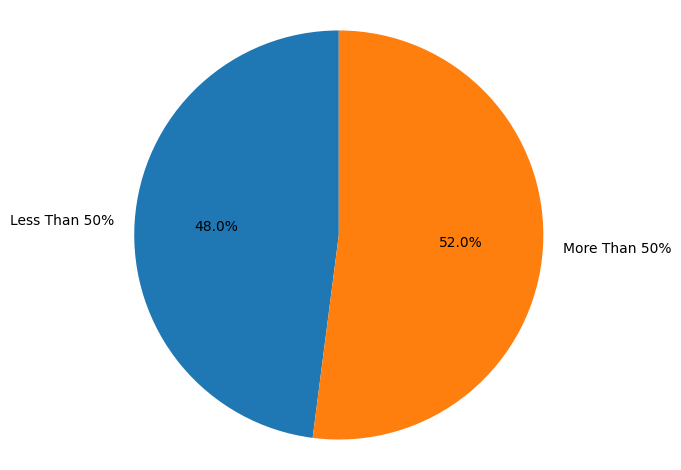

In [34]:
train['bins'] = pd.cut(train['bad_debt'],bins=[0,0.1,1.5], labels=["Less Than 50%","More Than 50%"])
train.groupby(['bins']).size().plot(kind='pie',subplots=True,startangle=90,autopct='%1.1f%%')
plt.axis('equal')
plt.tight_layout()
plt.show()

Create Box and whisker plot and analyze the distribution for 2nd mortgage, home equity, good debt, and bad debt for different cities

In [41]:
top_2500 = train[['state', 'lat', 'lng', 'second_mortgage', 'pct_own', 'place', 'state', 'city', 'COUNTYID', 'STATEID', 'home_equity', 'home_equity_second_mortgage', 'debt', 'hi_median', 'family_median']].nlargest(2563, ['second_mortgage', 'pct_own'])
# top_2500

top_2500['Bad_Debt'] = top_2500['second_mortgage'] + top_2500['home_equity'] - top_2500['home_equity_second_mortgage']
top_2500['Good_Debt'] = top_2500['debt'] - top_2500['Bad_Debt']

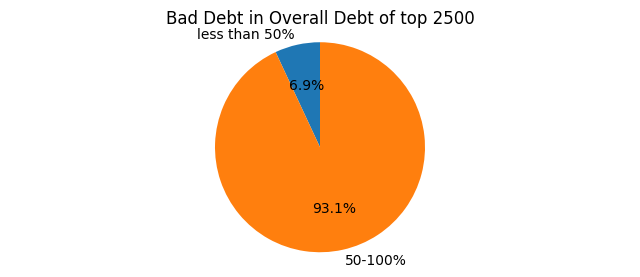

In [44]:
train['bins'] = pd.cut(top_2500['Bad_Debt'],bins=[0,0.10,1], labels=["less than 50%","50-100%"],)
train.groupby(['bins']).size().plot(kind='pie',subplots=True,figsize=(8, 3), startangle=90, autopct='%1.1f%%')
plt.axis('equal')
plt.title('Bad Debt in Overall Debt of top 2500')
plt.show()

In [45]:
l1 = list(top_2500['Bad_Debt'] )
l2 = list(top_2500['Good_Debt'] )
l3 = sum(zip(l1, l2+[0]), ())
size = 10
explode = [0.4] * size
explode = tuple(explode)
explode_bd = [0.5] * size*2
explode_bd = tuple(explode_bd)
labels_D = ['GD', 'BD'] * size
labels_D = tuple(labels_D)

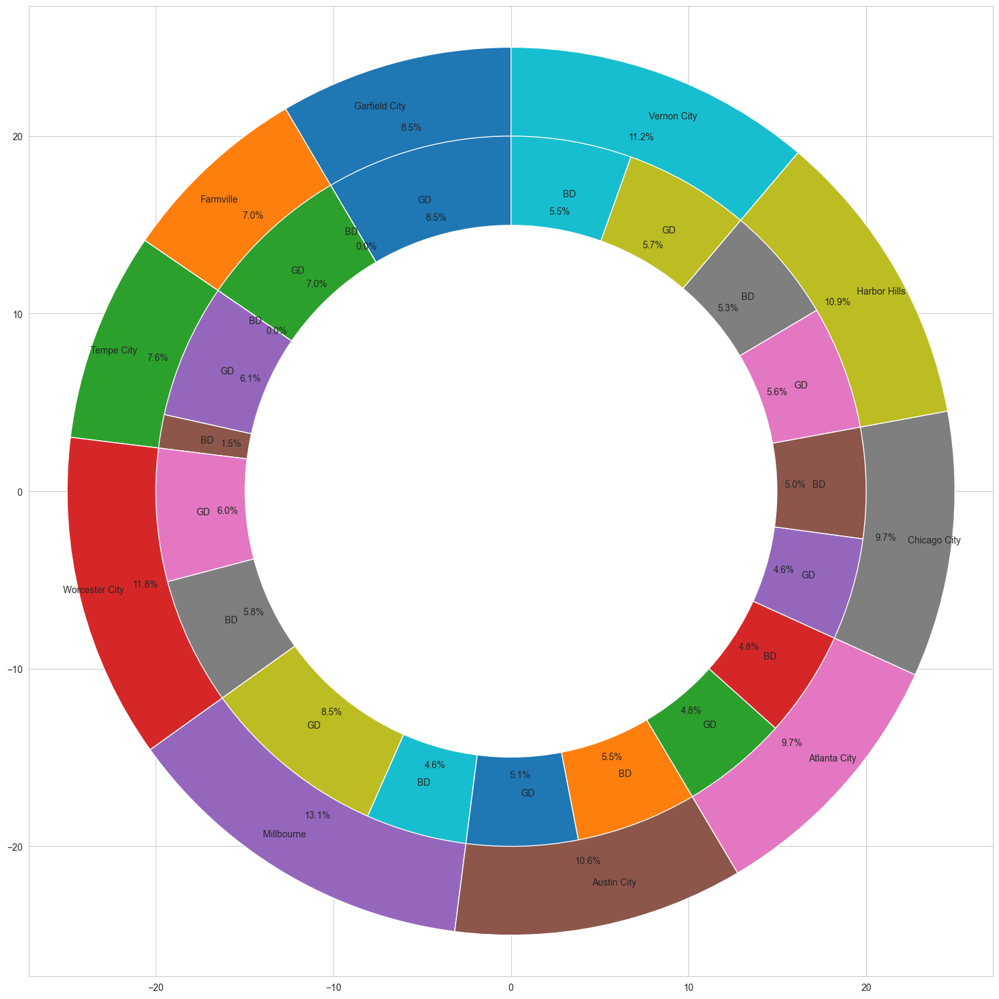

In [46]:
labels = list(top_2500.place[:10])
debt = list(top_2500.debt[:10])

sns.set_style("whitegrid")

gd_bd = l3[:20]

plt.figure(figsize = (15, 15))

plt.pie(debt, labels = labels, startangle = 90, frame = True, radius =25, autopct='%1.1f%%', pctdistance=0.85, labeldistance = 0.9)
plt.pie(gd_bd, labels = labels_D, startangle = 90, frame = True, radius = 20, autopct='%1.1f%%', pctdistance=0.80,  labeldistance = 0.85)
centre_circle = plt.Circle((0,0),15,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.axis('equal')
plt.tight_layout()
plt.show()

In [47]:
pd.set_option('display.max_rows',None)

In [48]:
train['city'].value_counts().to_frame()

,city
Chicago,286
Brooklyn,261
Los Angeles,219
Houston,213
Philadelphia,160
San Antonio,138
Baltimore,128
Las Vegas,123
Phoenix,114
Miami,105


Since it is difficult to show all locations, without compromising readability, I have limited my selection to Top 10 cities

In [49]:
train['city'].value_counts()[:10].index

Index(['Chicago', 'Brooklyn', 'Los Angeles', 'Houston', 'Philadelphia',
       'San Antonio', 'Baltimore', 'Las Vegas', 'Phoenix', 'Miami'],
      dtype='object')

In [50]:
Top10_cities=['Chicago', 'Brooklyn', 'Los Angeles', 'Houston', 'Philadelphia','San Antonio', 'Baltimore', 'Las Vegas', 'Phoenix', 'Miami']

In [51]:
bplot = train[train['city'].isin(Top10_cities)]

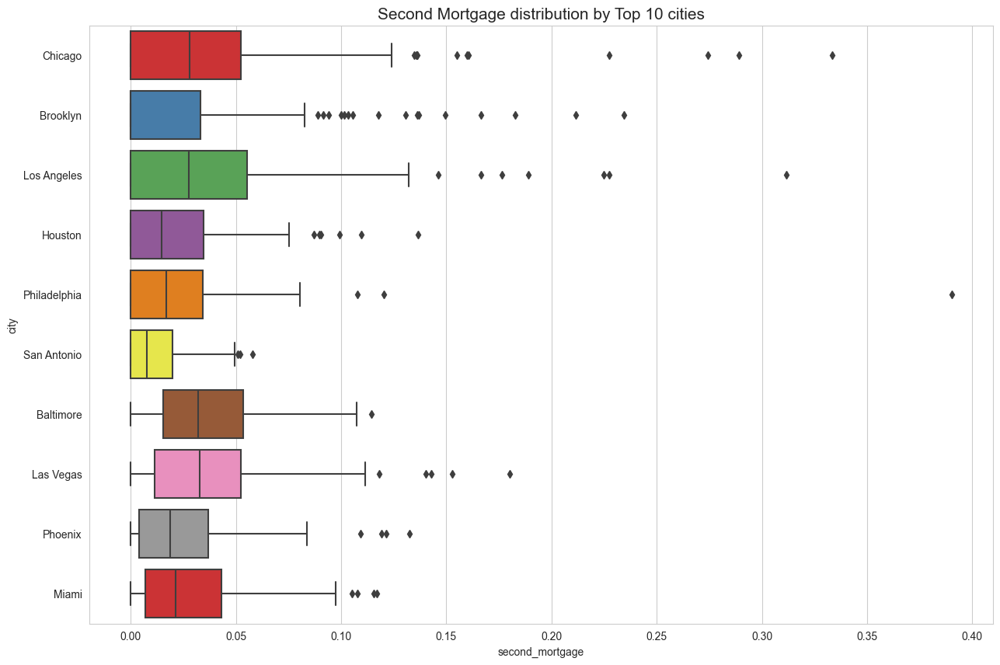

In [52]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
sns.boxplot(data=bplot,x='second_mortgage', y='city',palette="Set1",order=['Chicago', 'Brooklyn', 'Los Angeles', 'Houston', 'Philadelphia','San Antonio',
                      'Baltimore', 'Las Vegas', 'Phoenix', 'Miami']).set_title('Second Mortgage distribution by Top 10 cities', fontsize = 15)
plt.show()

In [53]:
second_mortgage = list(top_2500.second_mortgage)
home_equity = list(top_2500.home_equity)

Good_Debt = list(top_2500.Good_Debt)
Bad_Debt = list(top_2500.Bad_Debt)

top_2500['city'].value_counts()[:20].index

Index(['Chicago', 'Los Angeles', 'Washington', 'Brooklyn', 'Milwaukee',
       'Aurora', 'Jacksonville', 'Denver', 'Las Vegas', 'Charlotte',
       'Minneapolis', 'Baltimore', 'Bronx', 'Sacramento', 'Long Beach',
       'Cincinnati', 'Colorado Springs', 'San Diego', 'Columbus',
       'New Orleans'],
      dtype='object')

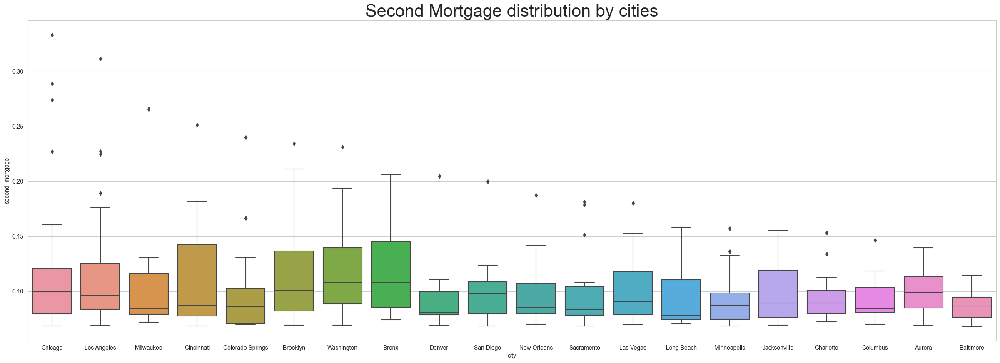

In [54]:
cities = ['Chicago', 'Los Angeles', 'Washington', 'Brooklyn', 'Aurora',
       'Milwaukee', 'Jacksonville', 'Bronx', 'Denver', 'Charlotte',
       'Las Vegas', 'Cincinnati', 'Minneapolis', 'Baltimore', 'Sacramento',
       'Long Beach', 'Colorado Springs', 'Columbus', 'San Diego',
       'New Orleans']
boxplot_df = top_2500[top_2500['city'].isin (cities)]
sns.set_style("whitegrid")
plt.figure(figsize = (30, 10))
sns.boxplot(x='city',y='second_mortgage',data=boxplot_df).set_title('Second Mortgage distribution by cities', fontsize = 30)
plt.show()

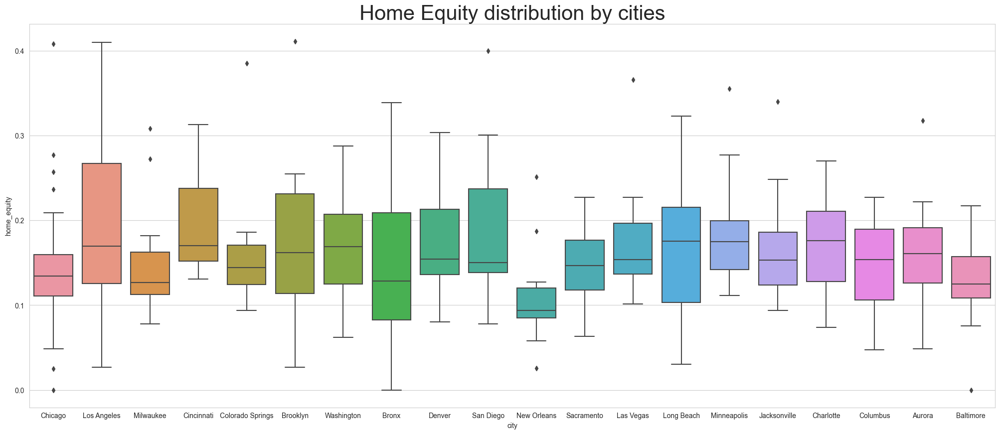

In [56]:
sns.set_style("whitegrid")
plt.figure(figsize = (25, 10))
sns.boxplot(x='city',y='home_equity',data=boxplot_df).set_title('Home Equity distribution by cities', fontsize = 30)
plt.show()

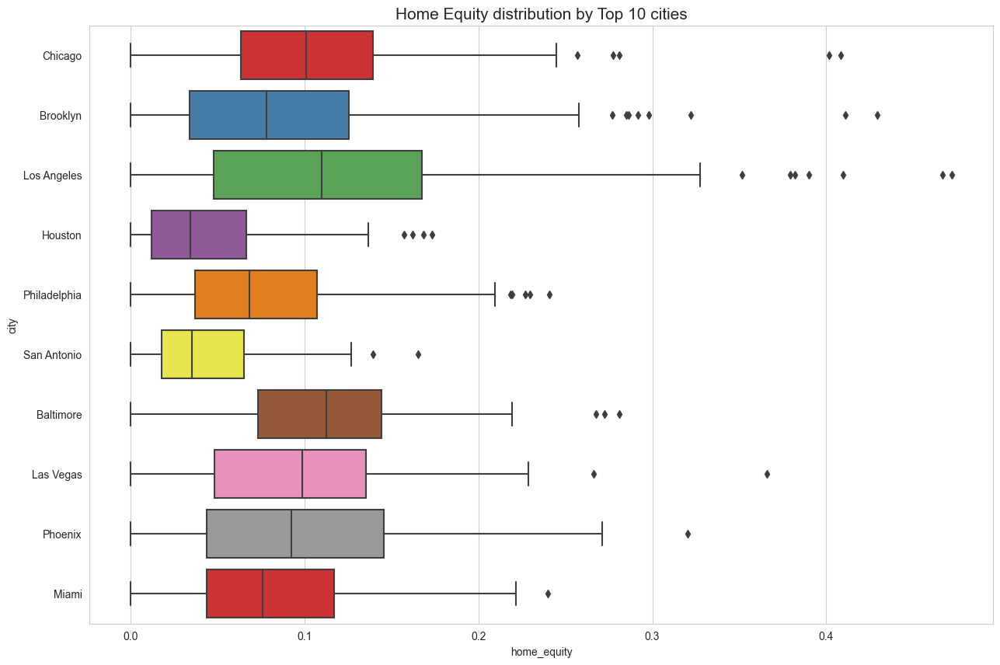

In [57]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
sns.boxplot(data=bplot,x='home_equity', y='city',palette="Set1",order=['Chicago', 'Brooklyn', 'Los Angeles', 'Houston', 'Philadelphia','San Antonio',
                      'Baltimore', 'Las Vegas', 'Phoenix', 'Miami']).set_title('Home Equity distribution by Top 10 cities', fontsize = 15)
plt.show()

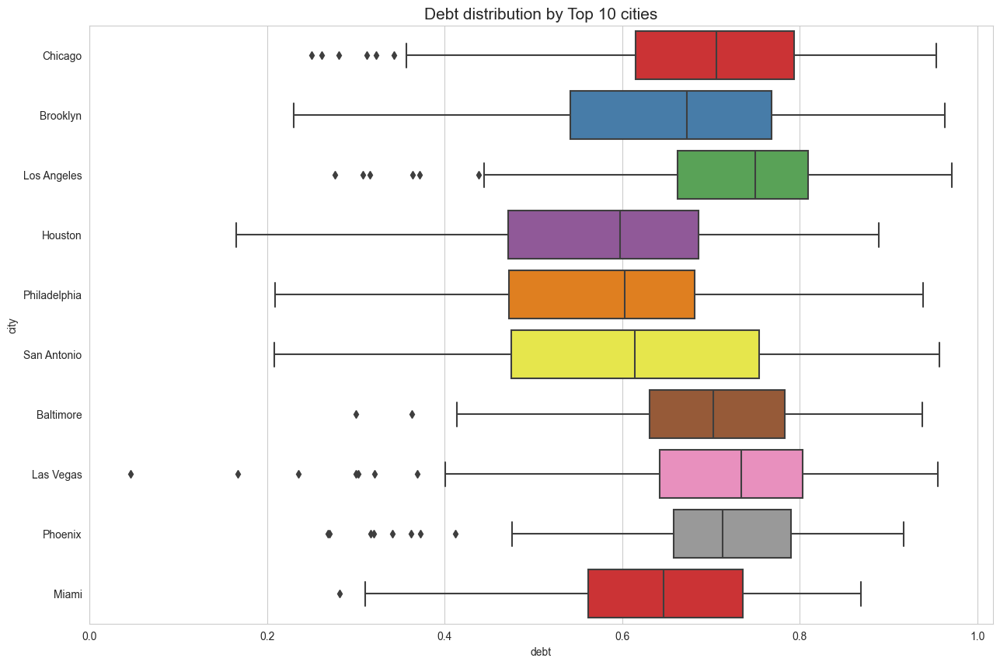

In [58]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
sns.boxplot(data=bplot,x='debt', y='city',palette="Set1",order=['Chicago', 'Brooklyn', 'Los Angeles', 'Houston', 'Philadelphia','San Antonio',
                      'Baltimore', 'Las Vegas', 'Phoenix', 'Miami']).set_title('Debt distribution by Top 10 cities', fontsize = 15)
plt.show()

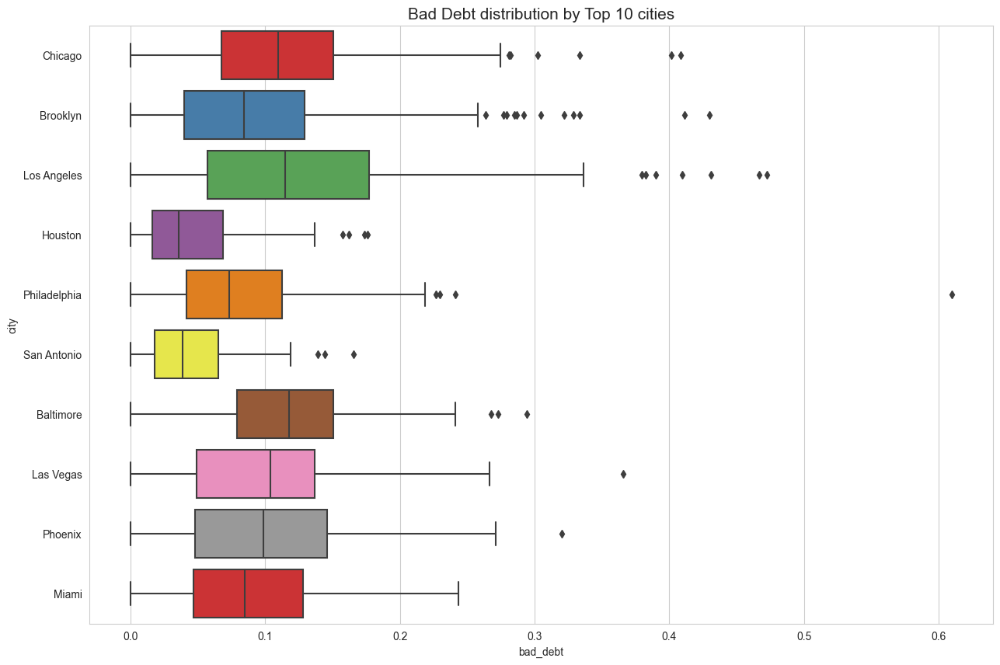

In [59]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
sns.boxplot(data=bplot,x='bad_debt', y='city',palette="Set1",order=['Chicago', 'Brooklyn', 'Los Angeles', 'Houston', 'Philadelphia','San Antonio',
                      'Baltimore', 'Las Vegas', 'Phoenix', 'Miami']).set_title('Bad Debt distribution by Top 10 cities', fontsize = 15)
plt.show()

In [62]:
top_2500['remaining_income'] = top_2500['family_median'] - top_2500['hi_median']
income_chart = round(top_2500[['city', 'hi_median', 'family_median', 'remaining_income']], 2)
income_chart

,city,hi_median,family_median,remaining_income
UID,,,,
264403,Passaic,28053.0,29340.0,1287.0
289712,Farmville,23236.0,59954.0,36718.0
222830,Scottsdale,40883.0,59657.0,18774.0
251185,Worcester,29037.0,40476.0,11439.0
278178,Philadelphia,12881.0,50622.0,37741.0
287621,Austin,8309.0,9587.0,1278.0
239636,Atlanta,17818.0,20712.0,2894.0
242690,Chicago,17723.0,32662.0,14939.0
269323,Corona,46106.0,40462.0,-5644.0


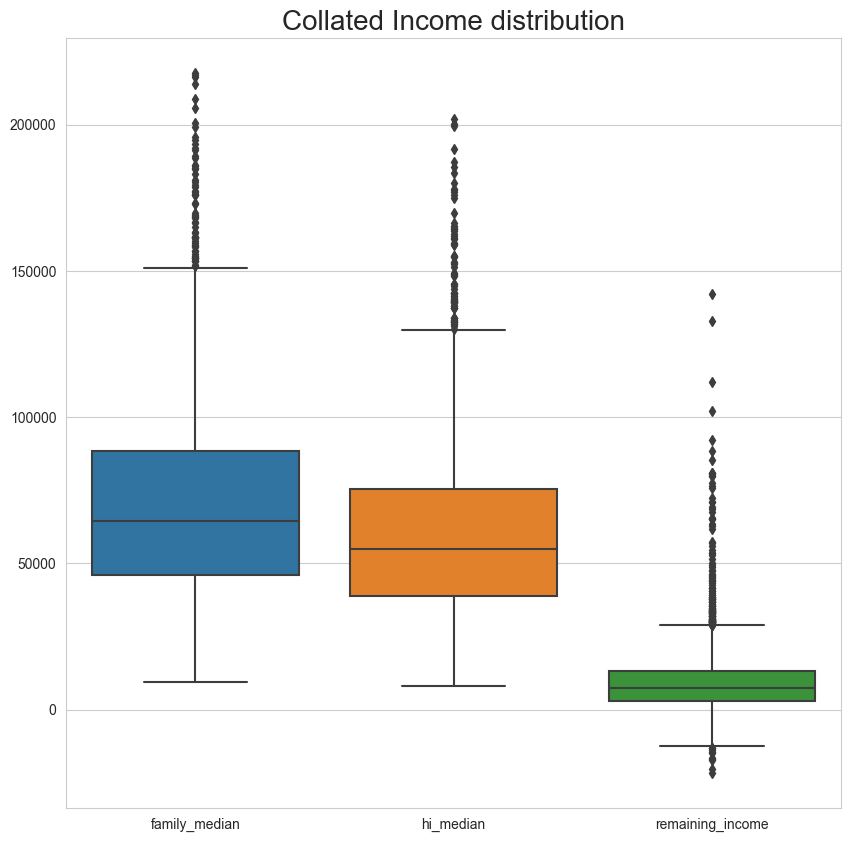

In [64]:
sns.set_style("whitegrid")
plt.figure(figsize = (10,10))
sns.boxplot(data=top_2500[['family_median', 'hi_median', 'remaining_income']]).set_title('Collated Income distribution', fontsize = 20)
plt.show()

In [66]:
density_eda_df = train[['state', 'city', 'place', 'ALand', 'pop', 'male_age_median', 'female_age_median', 'male_pop', 'female_pop']]
# density_eda_df.head()

density_eda_df['pop_density'] = density_eda_df['pop'] / density_eda_df['ALand']
density_eda_df['median_age'] = (density_eda_df['male_age_median'] *  density_eda_df['male_pop'] + density_eda_df['female_age_median'] *  density_eda_df['female_pop'])  / density_eda_df['pop']
density_eda_df.nlargest(300, 'pop_density')

pop_density_300 = density_eda_df.nlargest(300, 'pop_density')
cities = pop_density_300['city'].unique()
cities

array(['New York', 'Bronx', 'Elmhurst', 'Brooklyn', 'Flushing',
       'Jackson Heights', 'San Francisco', 'Long Island City',
       'Forest Hills', 'Chicago', 'Corona', 'Jamaica', 'Woodside',
       'Glendale', 'Astoria', 'Honolulu', 'Richmond Hill',
       'East Elmhurst', 'Rego Park', 'Guttenberg', 'Los Angeles',
       'Union City', 'West New York', 'Boston', 'Washington', 'Ridgewood',
       'Arlington', 'Ozone Park', 'Philadelphia', 'Hoboken', 'San Rafael',
       'South Richmond Hill', 'Yonkers', 'Jersey City'], dtype=object)

In [67]:
len(cities)

34

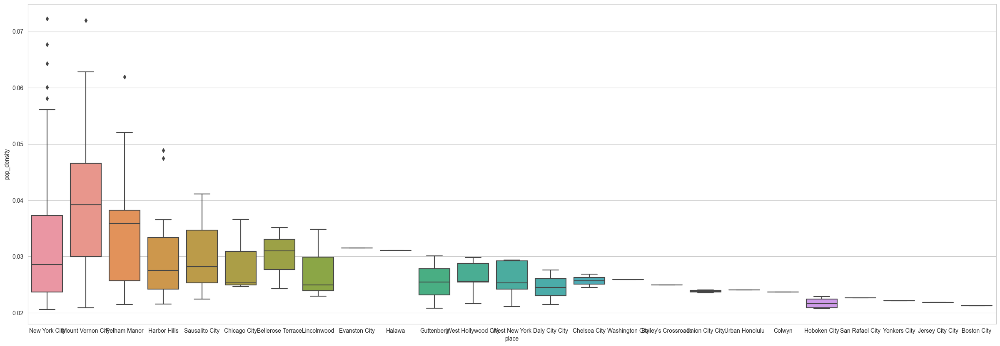

In [69]:
sns.set_style("whitegrid")
plt.figure(figsize = (30, 10))
sns.boxplot(x = 'place', y = 'pop_density', data=density_eda_df.nlargest(300, 'pop_density'))
plt.show()

In [70]:
list(density_eda_df.nsmallest(450, 'pop_density').state.unique())

['Alaska',
 'Montana',
 'Utah',
 'Oregon',
 'Nevada',
 'Colorado',
 'Idaho',
 'California',
 'New Mexico',
 'Maine',
 'South Dakota',
 'Wyoming',
 'Nebraska',
 'Texas',
 'Kansas',
 'North Dakota',
 'Arizona',
 'Washington',
 'New York',
 'Oklahoma',
 'Minnesota',
 'Louisiana',
 'Michigan',
 'Florida',
 'Wisconsin',
 'Mississippi',
 'New Hampshire',
 'Georgia',
 'Missouri',
 'Virginia',
 'Alabama',
 'Arkansas']

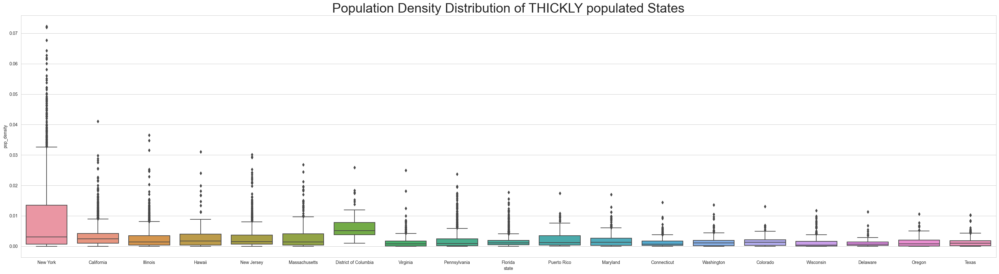

In [72]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 10))
sns.boxplot(x = 'state', y = 'pop_density', data=density_eda_df.nlargest(26585, 'pop_density'), order = ['New York', 'California', 'Illinois', 'Hawaii', 'New Jersey', 'Massachusetts', 'District of Columbia', 'Virginia',
                                                                                                                                                                            'Pennsylvania', 'Florida', 'Puerto Rico', 'Maryland', 'Connecticut', 'Washington', 'Colorado', 'Wisconsin',
                                                                                                                            'Delaware', 'Oregon', 'Texas']).set_title('Population Density Distribution of THICKLY populated States', fontsize = 30)
plt.show()

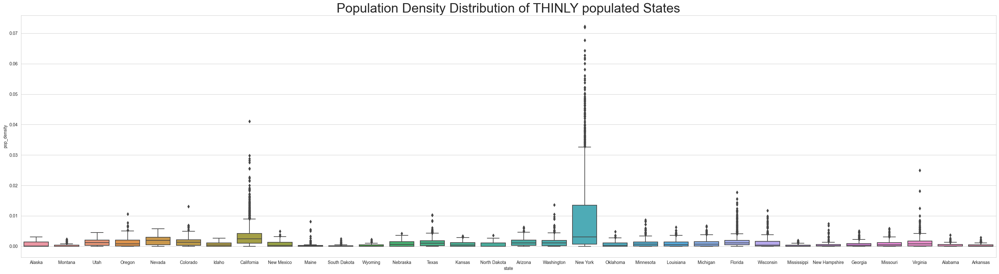

In [74]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 10))
sns.boxplot(x = 'state', y = 'pop_density', data=density_eda_df.nsmallest(27019, 'pop_density'), order = ['Alaska', 'Montana', 'Utah', 'Oregon', 'Nevada', 'Colorado', 'Idaho', 'California', 'New Mexico',
                                                                                                                                                                                 'Maine', 'South Dakota', 'Wyoming', 'Nebraska', 'Texas', 'Kansas', 'North Dakota', 'Arizona',
                                                                                                                                                                                 'Washington', 'New York', 'Oklahoma', 'Minnesota', 'Louisiana', 'Michigan', 'Florida', 'Wisconsin', 'Mississippi',
                                                                                                                                                                                 'New Hampshire', 'Georgia', 'Missouri', 'Virginia', 'Alabama', 'Arkansas']).set_title('Population Density Distribution of THINLY populated States', fontsize = 30)
plt.show()

Top cities that has highest number of records:
 ['Chicago' 'Brooklyn' 'Houston' 'Los Angeles' 'Philadelphia']


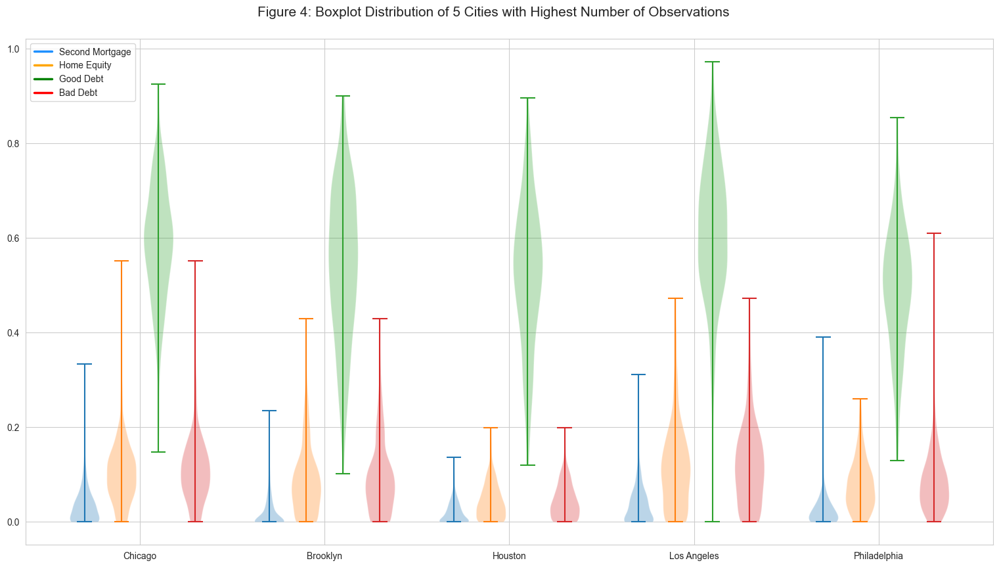

In [153]:
df_combined = train.append(test, ignore_index=True)

df_combined['bad_debt'] = df_combined['second_mortgage'] + df_combined['home_equity'] - df_combined['home_equity_second_mortgage']
df_combined['good_debt'] = df_combined['debt'] - df_combined['bad_debt']#

df_assets_city = df_combined.groupby('city')['bad_debt'].agg(['mean','count']).reset_index()
df_top_count = df_assets_city.sort_values(by='count', ascending = False)#.iloc[:9,:]

city_top_count = df_top_count['city'].head().to_numpy()
print('Top cities that has highest number of records:\n', city_top_count)

df_city_top_count = df_combined.loc[df_combined['city'].isin(city_top_count),['city','second_mortgage','home_equity','good_debt','bad_debt']]

df_assets_city = df_combined.groupby('city')['bad_debt'].agg(['mean','count']).reset_index()
df_top_count = df_assets_city.sort_values(by='count', ascending = False)#.iloc[:9,:]
df_top_count.head()

# Filter the combined dataframe to select recordings that match the most frequent cities and select 4 required statistics  
df_city_top_count = df_combined.loc[df_combined['city'].isin(city_top_count),['city','second_mortgage','home_equity','good_debt','bad_debt']]
# Number of samples after filtering
df_combined.loc[df_combined['city'].isin(city_top_count),['city']].shape[0]


def set_box_color(bp, color):
    plt.setp(bp['boxes'], color=color)
    plt.setp(bp['whiskers'], color=color)
    plt.setp(bp['caps'], color=color)
    plt.setp(bp['medians'], color=color)

chosen_per = [6, 8, 10, 12, 14]
cols = ['second_mortgage', 'home_equity', 'good_debt', 'bad_debt']
colors = ['dodgerblue', 'orange', 'green', 'red']
labels =['Second Mortgage', 
         'Home Equity', 
         'Good Debt', 
         'Bad Debt']
from matplotlib.lines import Line2D
fig, axs = plt.subplots(figsize=(19, 10))
#axs.set_ylim(-12, 6)
#axs.set_xlim(-0.7,4.5)
for i in range(len(cols)):
    bp=axs.violinplot([df_city_top_count[df_city_top_count['city']==p][cols[i]] for p in city_top_count],
                positions=np.array(range(len(chosen_per)))*1.0+0.2*(i+1), widths = 0.16)
    #bp.set_color(colors[i])
    #set_box_color(bp, colors[i])
       
#axs1.set_title('Relative Percentage Error for Missing All Parameters on Each Bus')
axs.set_xticks([0.5, 1.5, 2.5, 3.5, 4.5])#[0.5, 1.5, 2.5])
axs.set_xticklabels(city_top_count)
plt.suptitle("Figure 4: Boxplot Distribution of 5 Cities with Highest Number of Observations",fontsize=15, y=0.93)
plt.legend(handles=[Line2D([0], [0], color=colors[i], lw=2.5,label=labels[i]) for i in range(len(labels))], loc='upper left')
plt.show()

In [154]:
df_state_income = df_combined[['state','hi_mean','family_mean']]
df_state_income['remaining'] = df_state_income['family_mean'] - df_state_income['hi_mean']

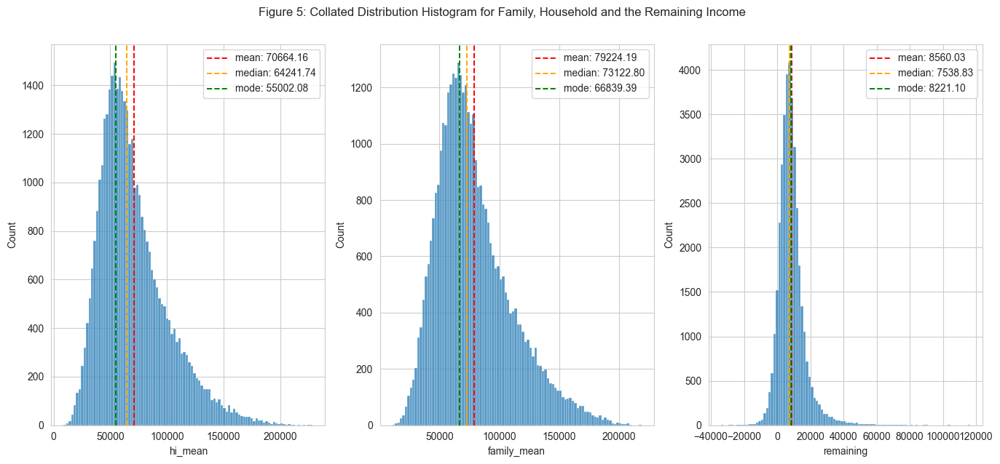

In [155]:
fig, ax = plt.subplots(1,3, figsize=(16.5,6.8))
cats = df_state_income.columns[-3:]
for i in range(len(cats)):   
    sns.histplot(data=df_state_income, x=cats[i], ax=ax[i], bins=100)
    mean = df_state_income[cats[i]].mean()
    median = df_state_income[cats[i]].median()
    mode = pd.cut(df_state_income[cats[i]], bins=100).mode()[0].right
    ax[i].axvline(x = mean, color = 'red', linestyle = '--', linewidth=1.4, label='mean: {:.2f}'.format(mean))
    ax[i].axvline(x = median, color = 'orange', linestyle = '--', linewidth=1.4, label='median: {:.2f}'.format(median))
    ax[i].axvline(x = mode, color = 'green', linestyle = '--', linewidth=1.4, label='mode: {:.2f}'.format(mode))
    ax[i].legend()

fig.suptitle("Figure 5: Collated Distribution Histogram for Family, Household and the Remaining Income", y=0.955)
plt.show()

In [156]:
top_states = df_state_income.groupby('state')['state'].agg(['count']).reset_index().sort_values(by='count',ascending=False).head(6)['state'].to_numpy()
print(top_states)

['California' 'Texas' 'New York' 'Florida' 'Pennsylvania' 'Illinois']


In [157]:
df_top_states = df_state_income[df_state_income['state'].isin(top_states)]
df_top_states.columns = ['state','Household Income', 'Family Income', 'Remaining']
df_top_states_melted = pd.melt(df_top_states, id_vars=['state'], value_vars=['Household Income', 'Family Income', 'Remaining'])
df_top_states_melted.head()

,state,variable,value
0,New York,Household Income,63125.28406
1,Texas,Household Income,57872.25064
2,New York,Household Income,69482.99919
3,California,Household Income,119148.78380
4,California,Household Income,44079.14486


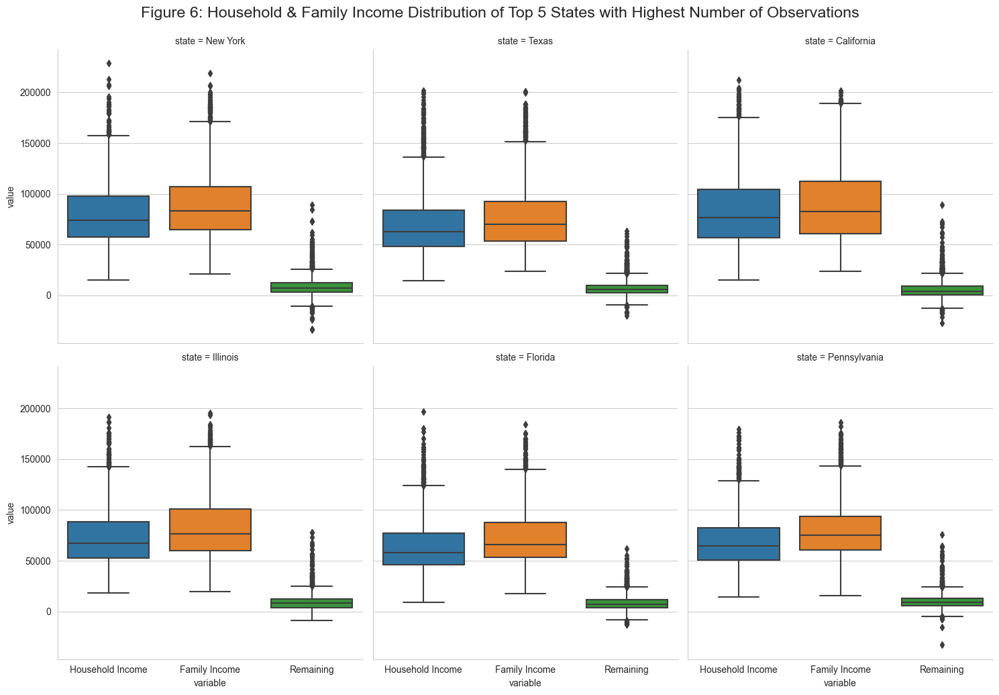

In [158]:
cat_plt = sns.catplot(data=df_top_states_melted, y='value',
                      kind='box', x='variable',
                      col='state',col_wrap=3)
cat_plt.fig.suptitle("Figure 6: Household & Family Income Distribution of Top 5 States with Highest Number of Observations", fontsize=16.8, y=1.03)
plt.show()

As can be seen in Figure 6, the distribution of 3 concerned types of income generally share the same sort of pattern compared to that of the national scale since they all have identical shape of household income and family income, family income slightly greater than household's and remaining mainly allocated from 0 to 25000. Notably, there are only New York, California and Illinois having with remarkably higher IQR range with the maximum statistics over 150000 USD; which demonstrates the high income range of these economic-centered cities.

 Create a collated income distribution chart for family income, house hold income, and remaining income

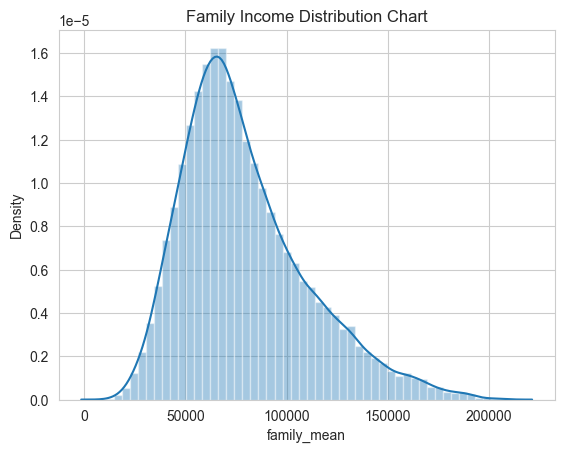

In [75]:
sns.distplot(train['family_mean'])
plt.title("Family Income Distribution Chart")
plt.show()

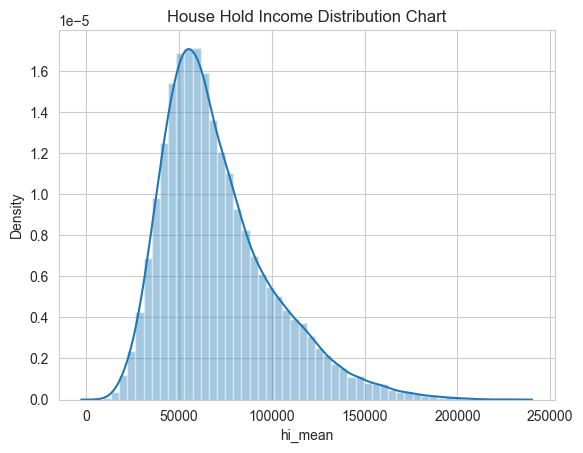

In [76]:
sns.distplot(train['hi_mean'])
plt.title("House Hold Income Distribution Chart")
plt.show()

In [77]:
train['remaining_income'] = train['family_mean']-train['hi_mean']

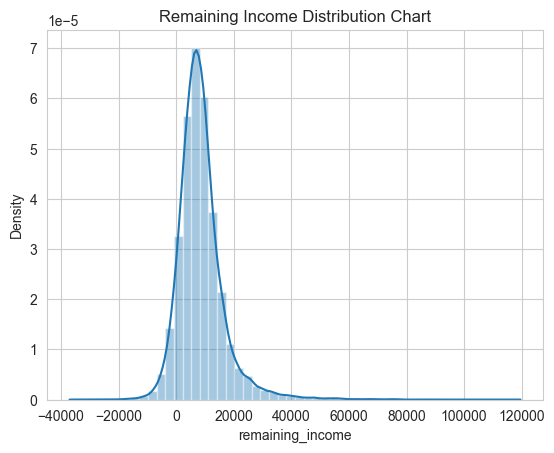

In [78]:
sns.distplot(train['remaining_income'])
plt.title("Remaining Income Distribution Chart")
plt.show()

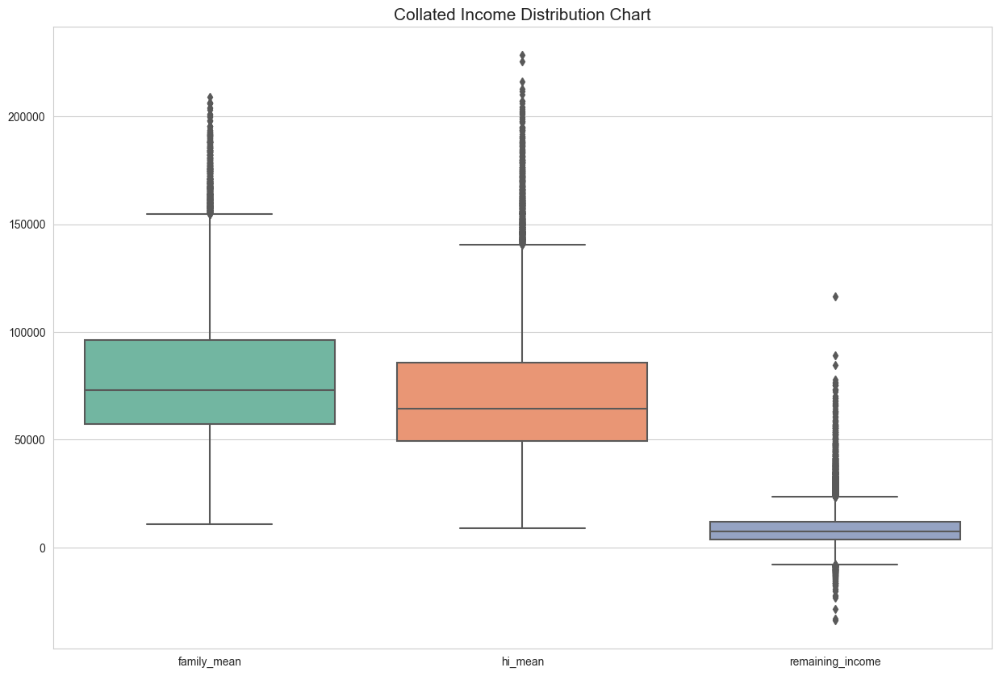

In [79]:
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
sns.boxplot(data=train[['family_mean','hi_mean','remaining_income']],palette="Set2").set_title('Collated Income Distribution Chart',fontsize=15)
plt.show()

# Project Task: Week 2

### Exploratory Data Analysis (EDA):

Perform EDA and come out with insights into population density and age. You may have to derive new fields (make sure to weight averages for accurate measurements):

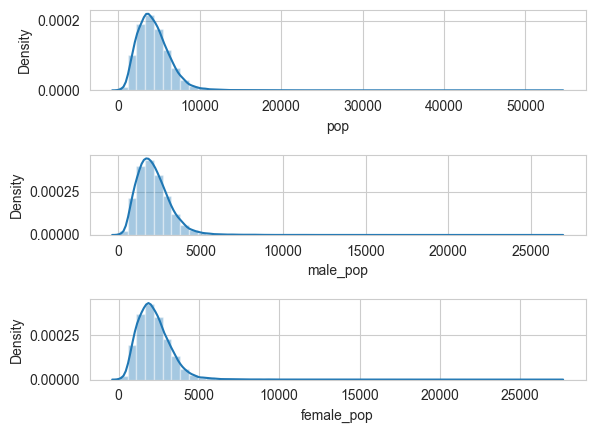

In [80]:
fig,(ax1,ax2,ax3)= plt.subplots(3,1)
sns.distplot(train['pop'],ax=ax1)
sns.distplot(train['male_pop'],ax=ax2)
sns.distplot(train['female_pop'],ax=ax3)
plt.subplots_adjust(wspace=0.8,hspace=0.8)
plt.tight_layout
plt.show()

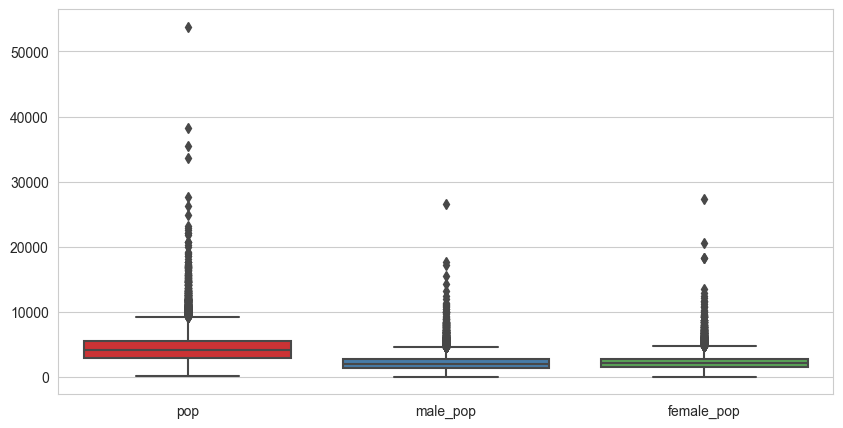

In [81]:
plt.figure(figsize=(10,5))
sns.boxplot(data=train[['pop','male_pop','female_pop']],palette="Set1")
plt.show()

a) Use pop and ALand variables to create a new field called population density

In [82]:
train['pop_density'] = train['pop']/train['ALand']
test['pop_density'] = test['pop']/train['ALand']

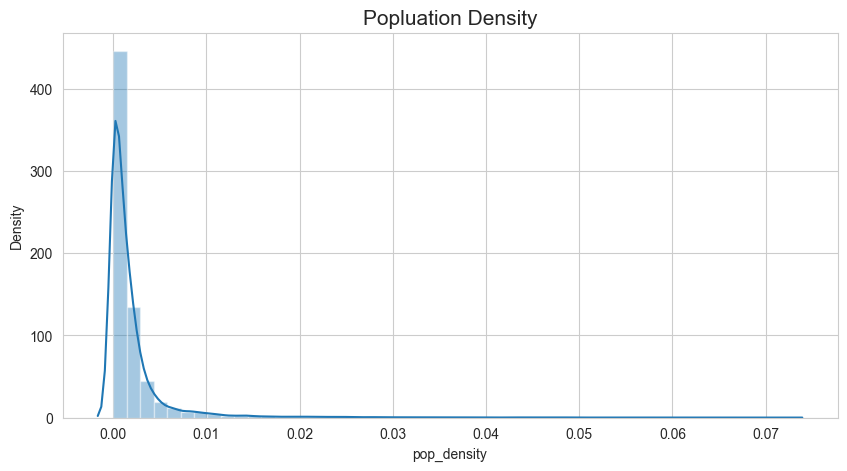

In [83]:
plt.figure(figsize=(10,5))
sns.distplot(train['pop_density']).set_title("Popluation Density",fontsize=15)
plt.show()

b)Use male_age_median, female_age_median, male_pop, and female_pop to create a new field called median age 

c) Visualize the findings using appropriate chart type

In [84]:
train['median_age'] = (train['male_age_median']*train['male_pop']+train['female_age_median']*train['female_pop'])/train['pop']
test['median_age'] = (test['male_age_median']*test['male_pop']+test['female_age_median']*test['female_pop'])/test['pop']

In [85]:
train.head(5)

,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,...,pct_own,married,married_snp,separated,divorced,bad_debt,bins,remaining_income,pop_density,median_age
UID,,,,,,,,,,,,,,,,,,,,,
267822,53,36,New York,NY,Hamilton,Hamilton,City,tract,13346,315,...,0.79046,0.57851,0.01882,0.01240,0.08770,0.09408,NaN,4868.86384,0.000026,44.667430
246444,141,18,Indiana,IN,South Bend,Roseland,City,tract,46616,574,...,0.52483,0.34886,0.01426,0.01426,0.09030,0.04274,NaN,8738.17744,0.001687,34.722748
245683,63,18,Indiana,IN,Danville,Danville,City,tract,46122,317,...,0.85331,0.64745,0.02830,0.01607,0.10657,0.09512,NaN,10319.83114,0.000099,41.774472
279653,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,tract,927,787,...,0.65037,0.47257,0.02021,0.02021,0.10106,0.01086,NaN,7668.01017,0.002442,49.879012
247218,161,20,Kansas,KS,Manhattan,Manhattan City,City,tract,66502,785,...,0.13046,0.12356,0.00000,0.00000,0.03109,0.05426,NaN,22219.26930,0.002207,21.965629


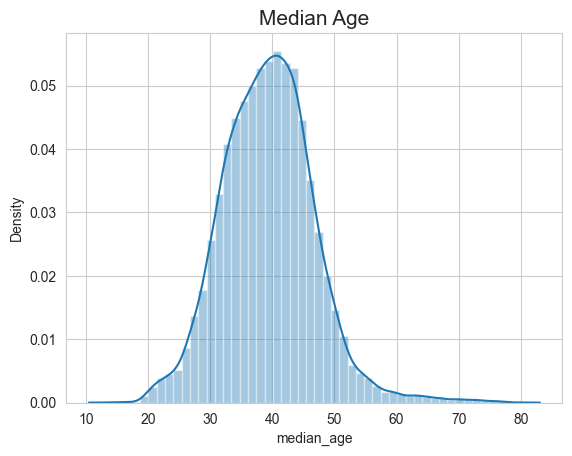

In [88]:
sns.distplot(train['median_age']).set_title('Median Age',fontsize=15)
plt.show()

### Inferences:
- Age of population is mostly between 20 and 60
- Majority are of age around 40
- Median age distribution has a gaussian distribution
- Some right skewness is noticed

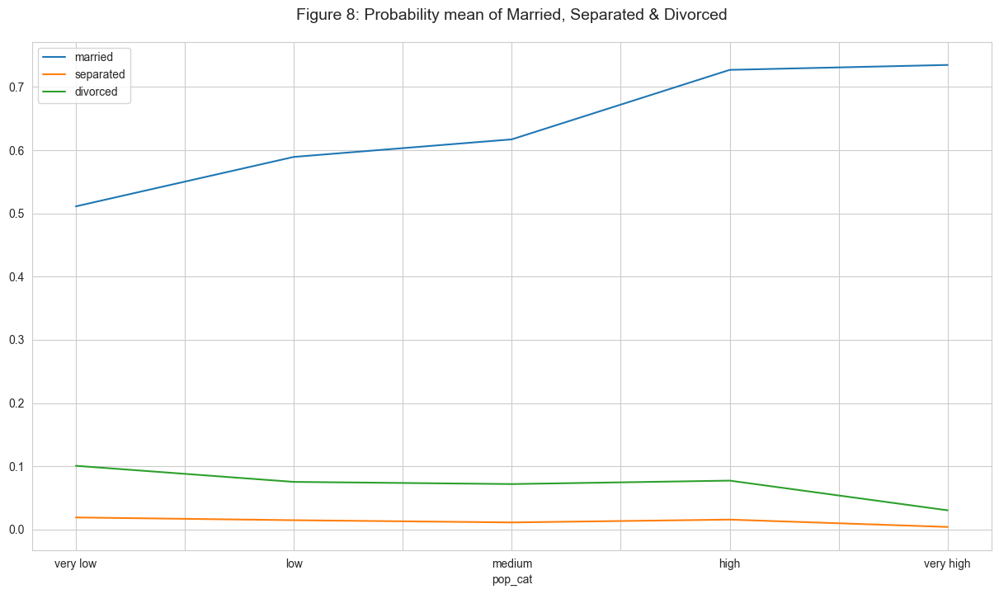

In [160]:
df_combined['pop'].describe()

df_combined['pop_cat'] = pd.cut(df_combined['pop'], bins=5, labels=['very low', 'low', 'medium', 'high', 'very high'])
df_combined['pop_cat'].value_counts(normalize=False)


df_combined.groupby('pop_cat')[['married','separated','divorced']].mean().plot(figsize=(15,8))
plt.title("Figure 8: Probability mean of Married, Separated & Divorced", fontsize=14, y=1.03)
plt.show()

Rent - Income Percentage of income in General & for each State

In [161]:
overall_rent_income = df_combined['rent_mean'].sum()/df_combined['family_mean'].sum()
print('Overall percentage of rent over family income: {:.2f}%'.format(overall_rent_income*100))

Overall percentage of rent over family income: 1.33%


In general, the overall percentage of rent accounts for 0.0133 of the summation of family's income average.

In [162]:
state_rent = df_combined.groupby('state')['rent_mean'].mean().reset_index()
state_rent.sort_values(by='rent_mean').head()

,state,rent_mean
39,Puerto Rico,524.685247
49,West Virginia,674.666645
42,South Dakota,676.777788
3,Arkansas,713.879645
17,Kentucky,731.970899


In [163]:
state_income = df_combined.groupby('state')['family_mean'].mean().reset_index()
state_income.sort_values(by='family_mean').head()

,state,family_mean
39,Puerto Rico,33812.979647
24,Mississippi,59518.695623
3,Arkansas,63939.536360
49,West Virginia,65108.786482
0,Alabama,65183.236790


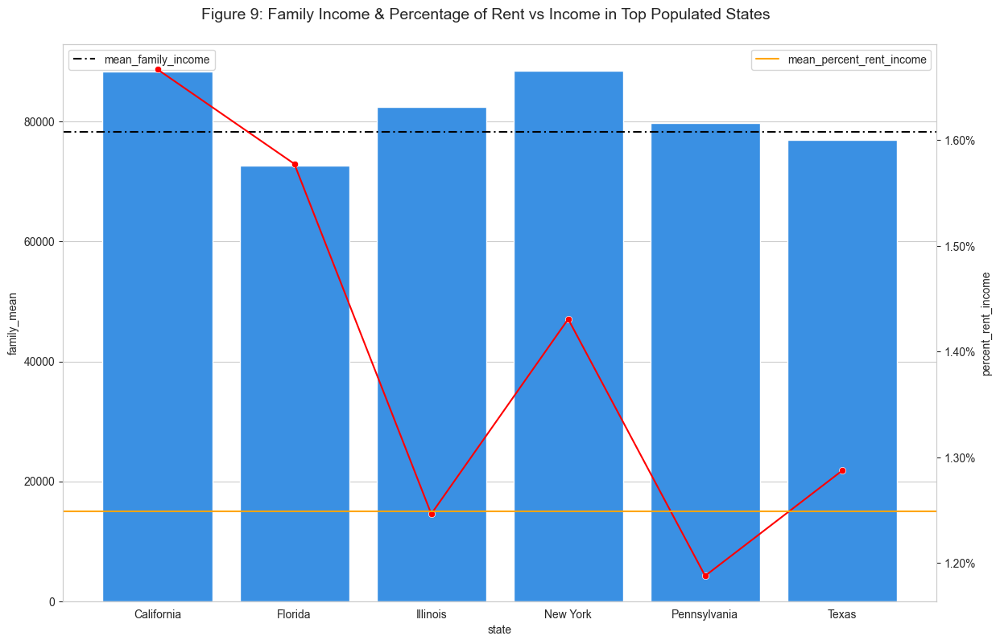

In [164]:
state_income['rent_mean'] = state_rent['rent_mean']
state_income['percent_rent_income'] =  100*state_rent['rent_mean']/state_income['family_mean']
state_income.head(8)

top_state_income=state_income[state_income['state'].isin(top_states)]#[['state','family_mean', 'rent_mean']]
import matplotlib.ticker as mtick
fig, ax1 = plt.subplots(figsize=(14,9))
fig.suptitle("Figure 9: Family Income & Percentage of Rent vs Income in Top Populated States", fontsize=14, y=0.93)
ax1.axhline(y=state_income['family_mean'].mean(), color='black', label='mean_family_income', dashes=(5, 2, 1, 2))
#ax1.bar(top_state_income['state'], top_state_income['family_mean'])
sns.barplot(data=top_state_income, x='state', y='family_mean', ax=ax1, color='dodgerblue')
#sns.barplot(data=top_state_income, x='state', y='rent_mean', ax=ax1)
plt.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
#ax1.scatter(top_state_income['state'], top_state_income['percent_rent_income'])
sns.lineplot(data=top_state_income, x='state', y='percent_rent_income', ax=ax2, color='red')
sns.scatterplot(data=top_state_income, x='state', y='percent_rent_income', ax=ax2, color='red')
ax2.axhline(y=state_income['percent_rent_income'].mean(), color='orange', label='mean_percent_rent_income')
ax2.grid(False)
plt.legend()
plt.show()

Create bins for population into a new variable by selecting appropriate class interval so that the number of categories don’t exceed 5 for the ease of analysis.

In [91]:
train['pop'].value_counts()

4028     14
4824     14
3842     14
3706     14
4409     14
3534     13
4387     13
4566     13
2872     13
4946     13
2451     13
2551     12
3370     12
3495     12
3570     12
4902     12
3813     12
3273     12
3947     12
4603     12
4048     12
3401     12
3963     12
4557     12
2555     12
3655     12
2749     12
3485     12
4514     12
4035     12
4452     11
4853     11
2977     11
2508     11
3288     11
3752     11
3163     11
4828     11
5245     11
3598     11
3558     11
5019     11
3417     11
4388     11
2961     11
4735     11
2493     11
3059     11
4223     11
2385     11
3369     11
4318     11
3644     11
3496     11
3463     11
2707     11
3356     11
6083     11
4019     11
3528     11
5154     11
3265     11
3438     11
3510     10
4289     10
2930     10
5114     10
4478     10
4067     10
3497     10
3024     10
4481     10
3901     10
3866     10
4125     10
4779     10
3468     10
3726     10
3257     10
3275     10
3702     10
3656     10
2395     10
3634

In [92]:
train['male_age_median'].unique()

array([44.     , 32.     , 40.83333, 48.91667, 22.41667, 41.41667,
       40.     , 53.08333, 30.66667, 47.33333, 34.33333, 46.91667,
       49.75   , 34.66667, 42.58333, 45.83333, 44.16667, 32.5    ,
       30.41667, 27.41667, 30.08333, 41.16667, 38.75   , 30.     ,
       31.16667, 46.75   , 36.66667, 38.16667, 34.91667, 40.16667,
       27.66667, 39.33333, 42.83333, 36.41667, 41.91667, 44.5    ,
       51.75   , 43.41667, 51.66667, 34.     , 64.08333, 51.41667,
       20.25   , 29.     , 28.     , 41.25   , 49.83333, 24.91667,
       45.41667, 28.16667, 34.08333, 36.91667, 46.66667, 36.16667,
       36.75   , 38.5    , 36.08333, 47.5    , 51.16667, 48.16667,
       33.     , 25.25   , 37.08333, 42.66667, 40.25   , 29.75   ,
       38.41667, 37.41667, 42.     , 44.08333, 36.5    , 32.16667,
       35.91667, 39.5    , 37.75   , 38.58333, 21.25   , 35.33333,
       40.41667, 46.08333, 54.41667, 41.5    , 37.83333, 31.41667,
       41.75   , 32.41667, 26.66667, 39.83333, 31.91667, 34.58

### The IntelliSense Age Group defaults are:

- Kid(0 to 9)
- Youth (10 to 17)
- Young Adult (18 to 35)
- Adult (36 to 55)
- Senior (56 and up)

In [93]:
bins = [0,12,18,35,55,100]
labels = ['Kids','Youth','Young Adult','Adult','Senior']

In [94]:
train['state'].unique()

array(['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas',
       'South Carolina', 'California', 'Arkansas', 'Maryland', 'Illinois',
       'Iowa', 'Tennessee', 'Nevada', 'Louisiana', 'Colorado',
       'Rhode Island', 'Mississippi', 'New Jersey', 'Oregon', 'Arizona',
       'Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina',
       'Virginia', 'Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho',
       'South Dakota', 'Minnesota', 'Missouri', 'Washington', 'Wyoming',
       'Connecticut', 'West Virginia', 'Kentucky', 'Massachusetts',
       'District of Columbia', 'Hawaii', 'Montana', 'Alaska',
       'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota',
       'New Mexico', 'Maine', 'Delaware'], dtype=object)

In [95]:
train['state'].nunique()

52

In [96]:
pd.set_option('display.max_columns',None)

a) Analyze the married, separated, and divorced population for these population brackets

In [97]:
train['male_population'] = pd.cut(train['male_age_median'],bins,labels=labels)
train['female_population'] = pd.cut(train['female_age_median'],bins,labels=labels)
test['male_population'] = pd.cut(test['male_age_median'],bins,labels=labels)
test['female_population'] = pd.cut(test['female_age_median'],bins,labels=labels)

In [98]:
train.head()

,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,bad_debt,bins,remaining_income,pop_density,median_age,male_population,female_population
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,53,36,New York,NY,Hamilton,Hamilton,City,tract,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770,0.09408,NaN,4868.86384,0.000026,44.667430,Adult,Adult
246444,141,18,Indiana,IN,South Bend,Roseland,City,tract,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030,0.04274,NaN,8738.17744,0.001687,34.722748,Young Adult,Adult
245683,63,18,Indiana,IN,Danville,Danville,City,tract,46122,317,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657,0.09512,NaN,10319.83114,0.000099,41.774472,Adult,Adult
279653,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,tract,927,787,18.396103,-66.104169,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106,0.01086,NaN,7668.01017,0.002442,49.879012,Adult,Adult
247218,161,20,Kansas,KS,Manhattan,Manhattan City,City,tract,66502,785,39.195573,-96.569366,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096

b) Visualize using appropriate chart type

To ease the visulaize we are splitting states into 4 part which means there are  52 unique states and we are divding 52 states by 4.So, one part of the splitting will contain 13 states.

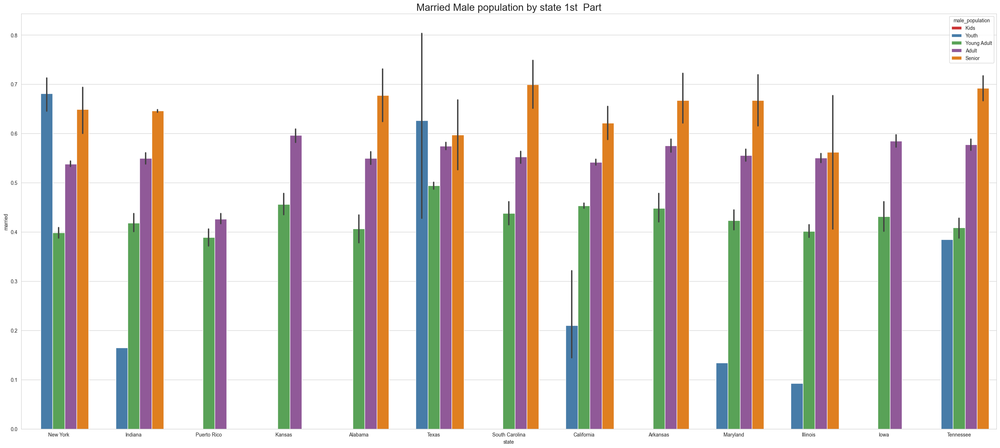

In [99]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='male_population',data=train,palette="Set1",order=['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas','South Carolina', 
       'California', 'Arkansas', 'Maryland', 'Illinois','Iowa', 'Tennessee',]).set_title('Married Male population by state 1st  Part', fontsize = 20)

plt.show()

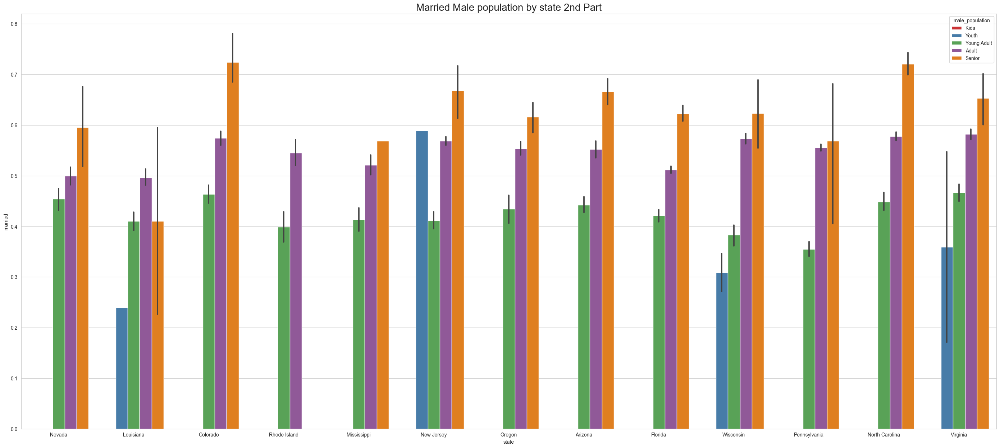

In [100]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='male_population',data=train,palette="Set1",order=['Nevada', 'Louisiana', 'Colorado','Rhode Island', 'Mississippi', 'New Jersey', 
       'Oregon', 'Arizona','Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina','Virginia']).set_title('Married Male population by state 2nd Part', fontsize = 20)

plt.show()

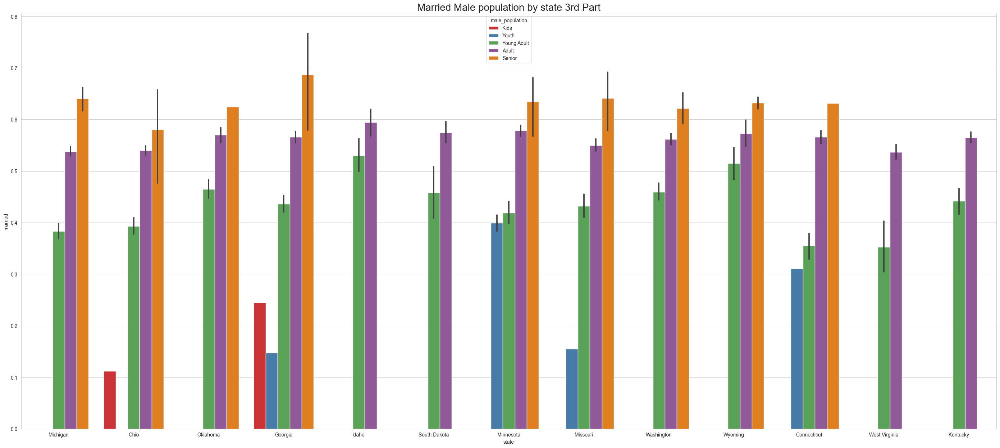

In [101]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='male_population',data=train,palette="Set1",order=['Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota',
           'Missouri', 'Washington', 'Wyoming', 'Connecticut', 'West Virginia', 'Kentucky']).set_title('Married Male population by state 3rd Part', fontsize = 20)

plt.show()

Ohio & Georgia have Married Male KIDS

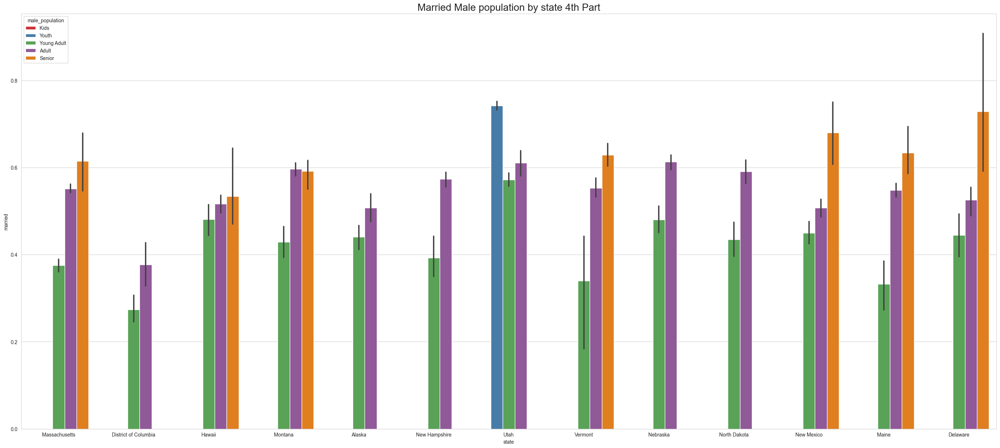

In [102]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='male_population',data=train,palette="Set1",order=['Massachusetts', 'District of Columbia', 'Hawaii', 'Montana', 'Alaska',
           'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 'New Mexico', 'Maine', 'Delaware']).set_title('Married Male population by state 4th Part', fontsize = 20)

plt.show()

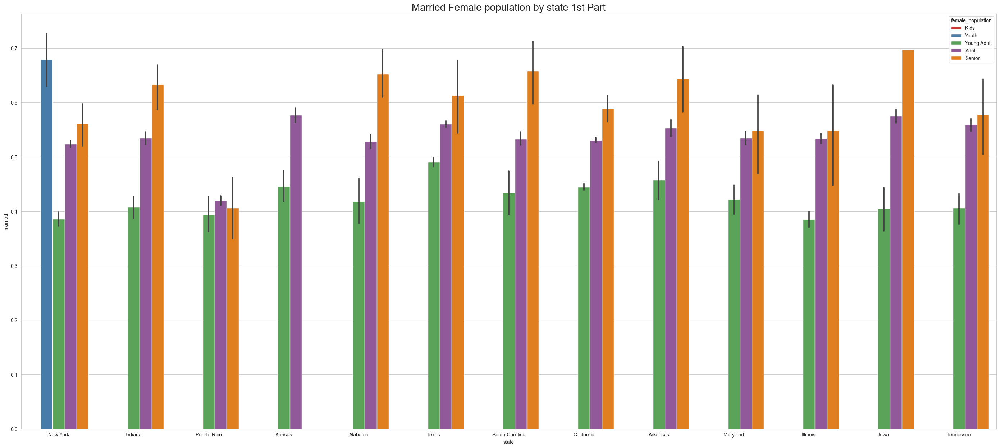

In [103]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='female_population',data=train,palette="Set1",order=['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas','South Carolina', 
       'California', 'Arkansas', 'Maryland', 'Illinois','Iowa', 'Tennessee',]).set_title('Married Female population by state 1st Part', fontsize = 20)

plt.show()

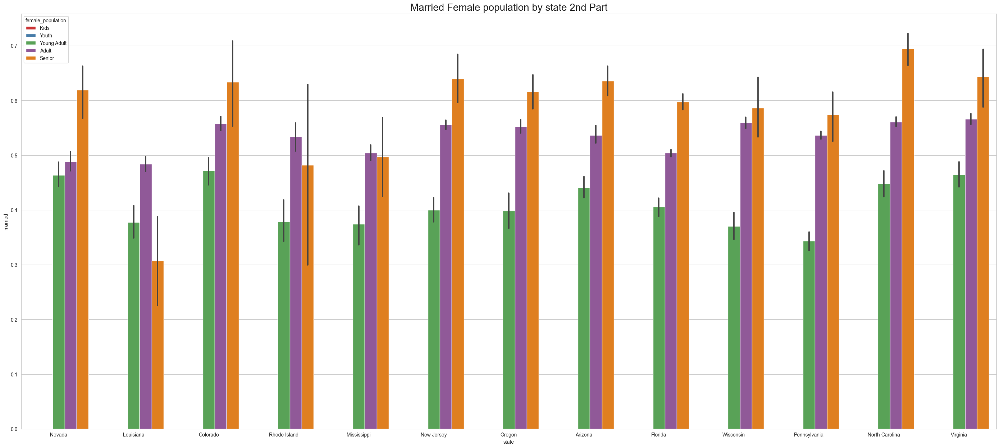

In [104]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='female_population',data=train,palette="Set1",order=['Nevada', 'Louisiana', 'Colorado','Rhode Island', 'Mississippi', 'New Jersey', 
       'Oregon', 'Arizona','Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina','Virginia']).set_title('Married Female population by state 2nd Part', fontsize = 20)

plt.show()

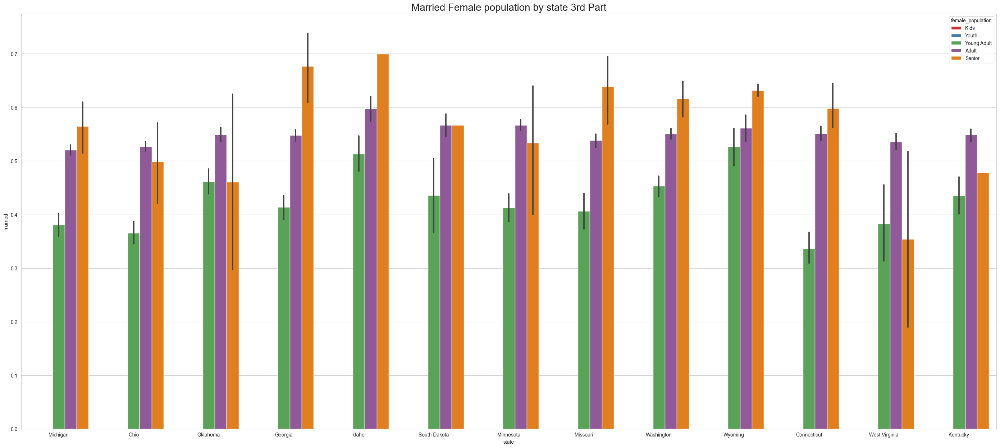

In [105]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='female_population',data=train,palette="Set1",order=['Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota',
           'Missouri', 'Washington', 'Wyoming', 'Connecticut', 'West Virginia', 'Kentucky']).set_title('Married Female population by state 3rd Part', fontsize = 20)

plt.show()

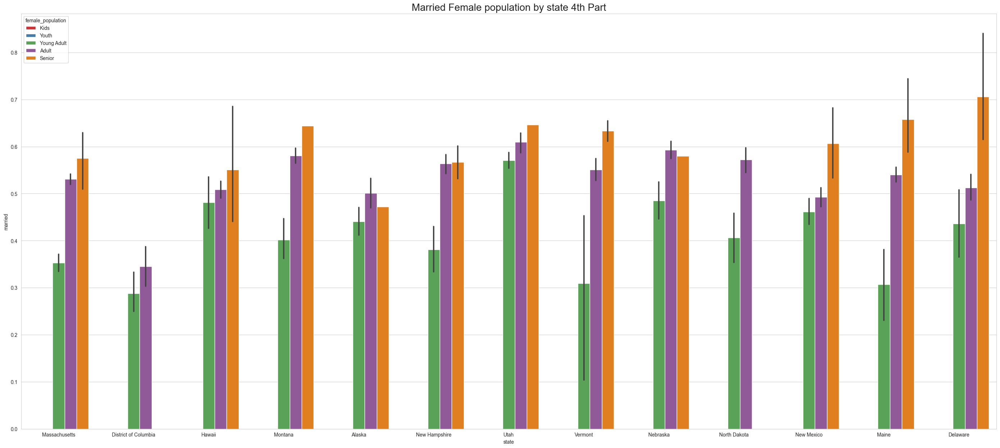

In [106]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='married',hue='female_population',data=train,palette="Set1",order=['Massachusetts', 'District of Columbia', 'Hawaii', 'Montana', 'Alaska',
           'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 'New Mexico', 'Maine', 'Delaware']).set_title('Married Female population by state 4th Part', fontsize = 20)

plt.show()

Except NewYork no other states has youth 

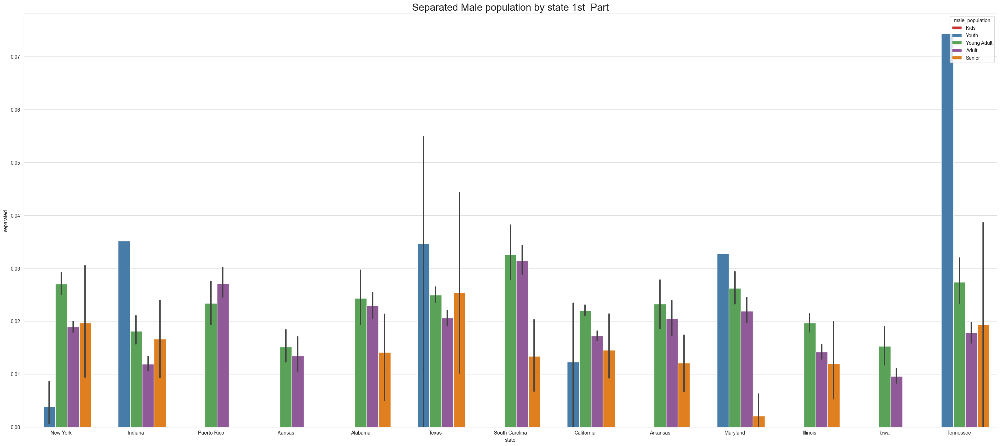

In [107]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='male_population',data=train,palette="Set1",order=['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas','South Carolina', 
       'California', 'Arkansas', 'Maryland', 'Illinois','Iowa', 'Tennessee',]).set_title('Separated Male population by state 1st  Part', fontsize = 20)

plt.show()

Tennessee has Highest youth separated in 1st part

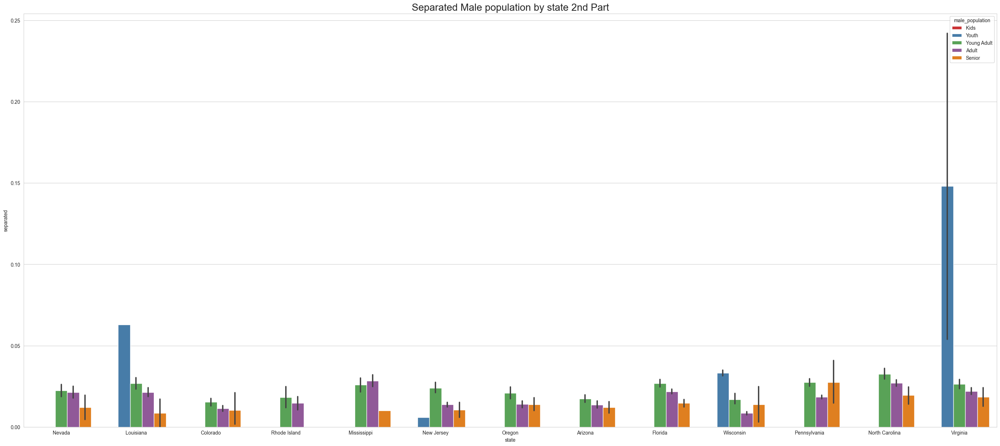

In [108]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='male_population',data=train,palette="Set1",order=['Nevada', 'Louisiana', 'Colorado','Rhode Island', 'Mississippi', 'New Jersey', 
       'Oregon', 'Arizona','Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina','Virginia']).set_title('Separated Male population by state 2nd Part', fontsize = 20)

plt.show()

Virgina Has highest youth seperated in 2nd part

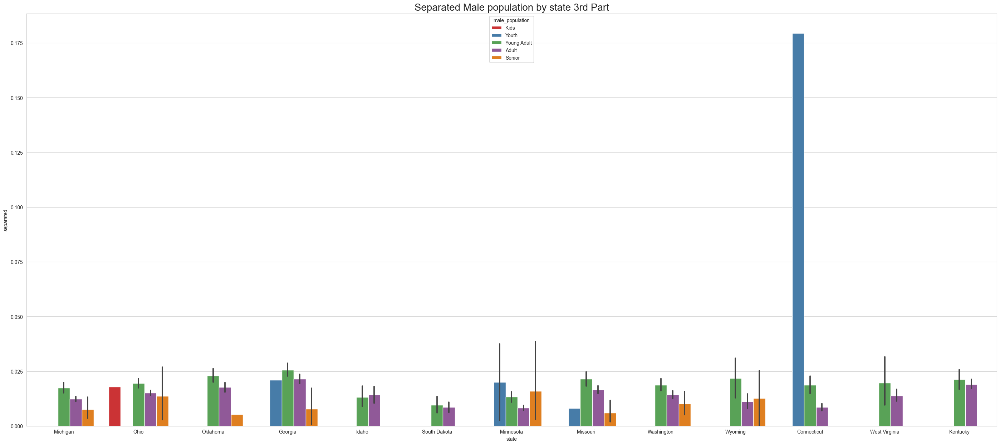

In [109]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='male_population',data=train,palette="Set1",order=['Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota',
           'Missouri', 'Washington', 'Wyoming', 'Connecticut', 'West Virginia', 'Kentucky']).set_title('Separated Male population by state 3rd Part', fontsize = 20)

plt.show()

Connecticut has highest youth seperated in 3rd Part

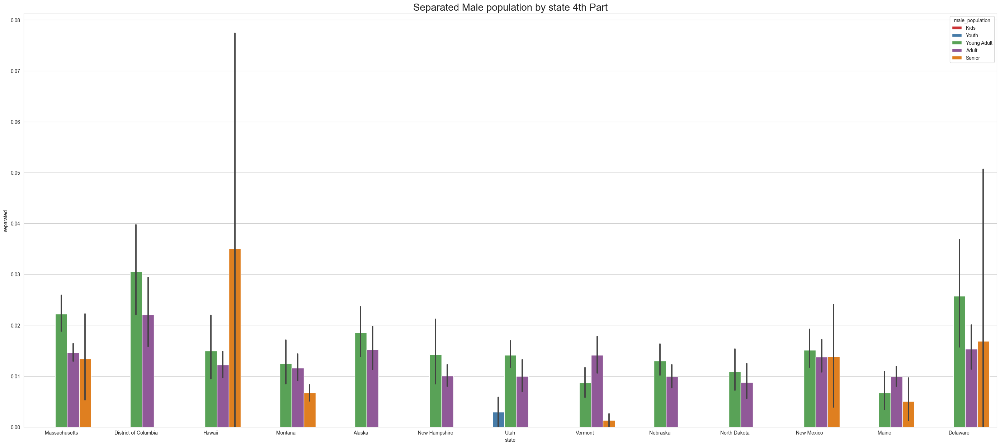

In [110]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='male_population',data=train,palette="Set1",order=['Massachusetts', 'District of Columbia', 'Hawaii', 'Montana', 'Alaska',
           'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 'New Mexico', 'Maine', 'Delaware']).set_title('Separated Male population by state 4th Part', fontsize = 20)

plt.show()

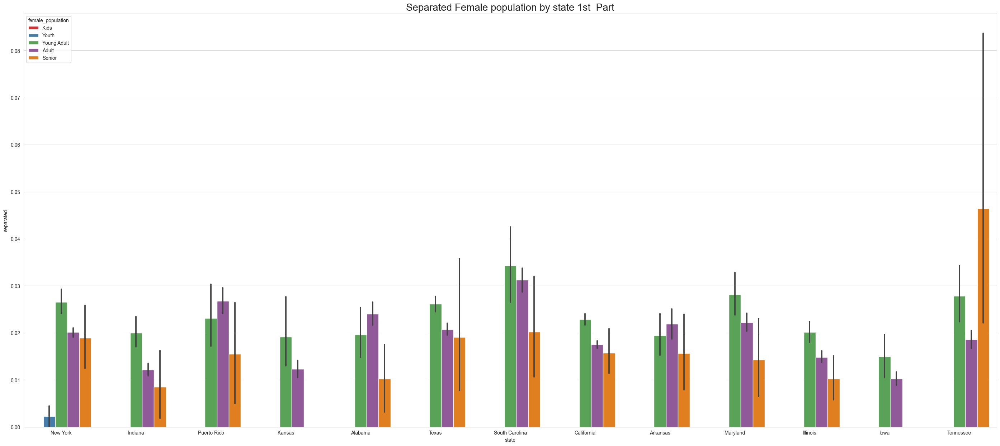

In [111]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='female_population',data=train,palette="Set1",order=['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas','South Carolina', 
       'California', 'Arkansas', 'Maryland', 'Illinois','Iowa', 'Tennessee',]).set_title('Separated Female population by state 1st  Part', fontsize = 20)

plt.show()

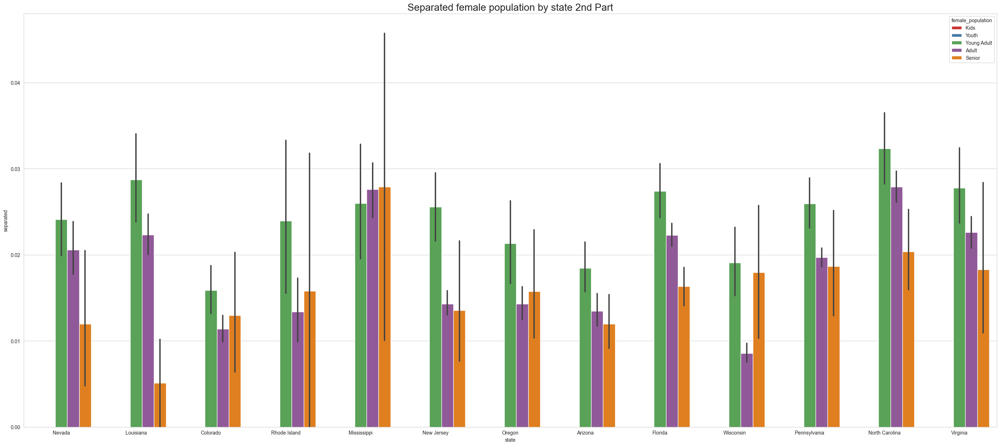

In [112]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='female_population',data=train,palette="Set1",order=['Nevada', 'Louisiana', 'Colorado','Rhode Island', 'Mississippi', 'New Jersey', 
       'Oregon', 'Arizona','Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina','Virginia']).set_title('Separated female population by state 2nd Part', fontsize = 20)

plt.show()

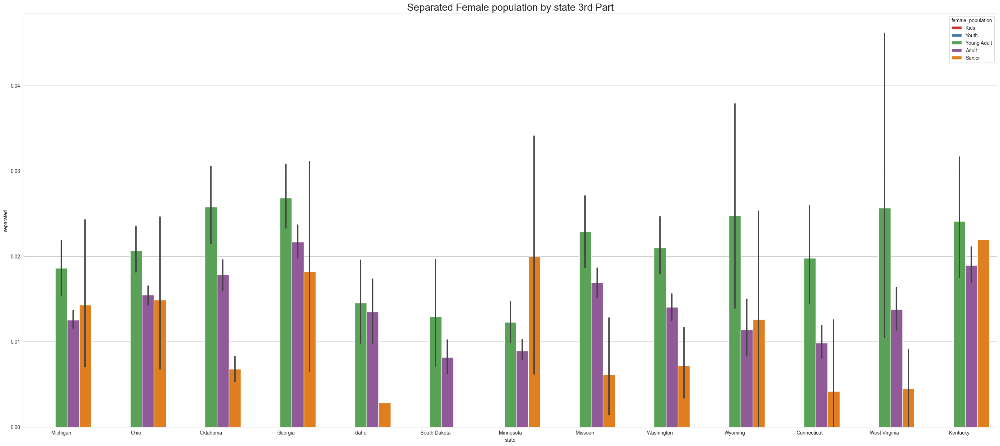

In [113]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='female_population',data=train,palette="Set1",order=['Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota',
           'Missouri', 'Washington', 'Wyoming', 'Connecticut', 'West Virginia', 'Kentucky']).set_title('Separated Female population by state 3rd Part', fontsize = 20)

plt.show()

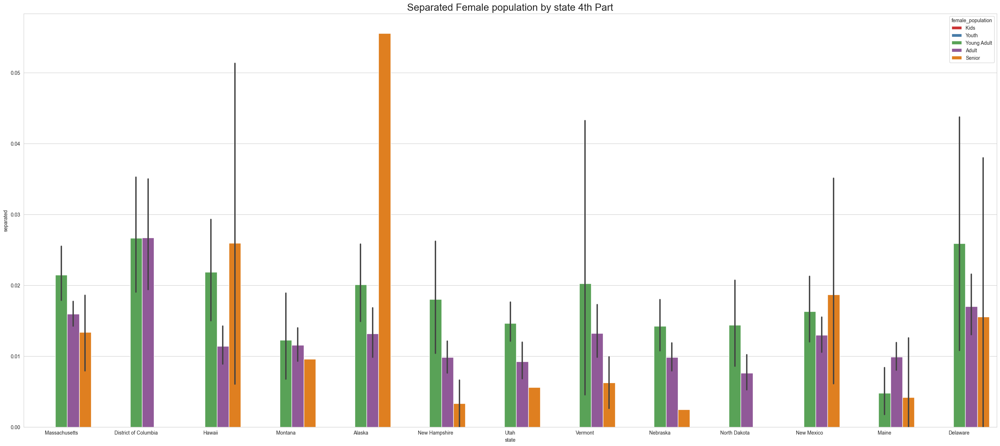

In [114]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='separated',hue='female_population',data=train,palette="Set1",order=['Massachusetts', 'District of Columbia', 'Hawaii', 'Montana', 'Alaska',
           'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 'New Mexico', 'Maine', 'Delaware']).set_title('Separated Female population by state 4th Part', fontsize = 20)

plt.show()


Except for Newyork, No other state has Separated Female Youth population Tennessee has the Highest Separated Female Senior population


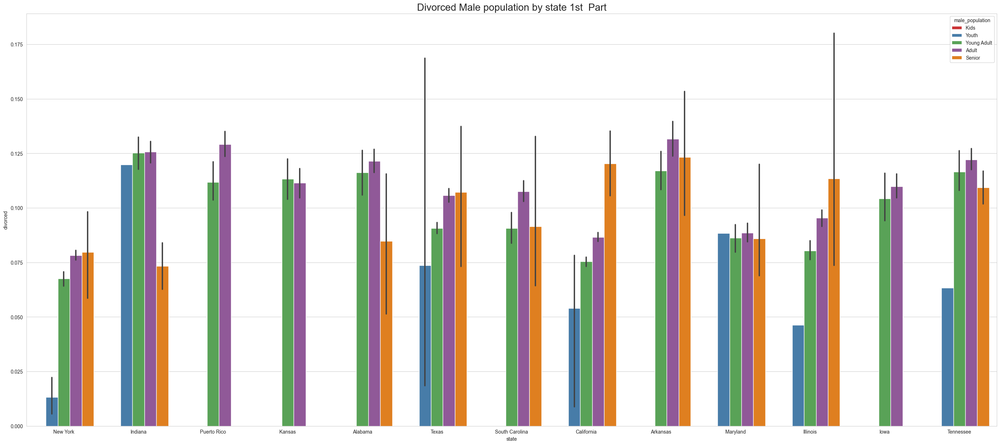

In [115]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='male_population',data=train,palette="Set1",order=['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas','South Carolina', 
       'California', 'Arkansas', 'Maryland', 'Illinois','Iowa', 'Tennessee',]).set_title('Divorced Male population by state 1st  Part', fontsize = 20)

plt.show()

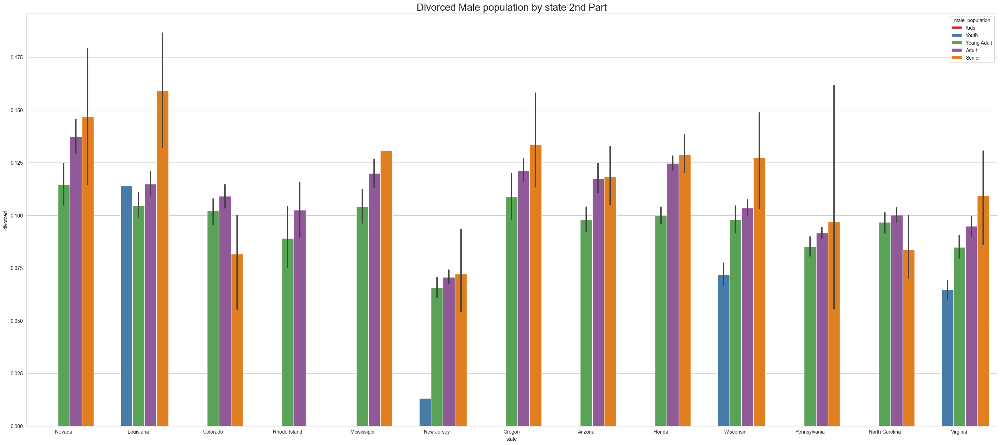

In [116]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='male_population',data=train,palette="Set1",order=['Nevada', 'Louisiana', 'Colorado','Rhode Island', 'Mississippi', 'New Jersey', 
       'Oregon', 'Arizona','Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina','Virginia']).set_title('Divorced Male population by state 2nd Part', fontsize = 20)

plt.show()

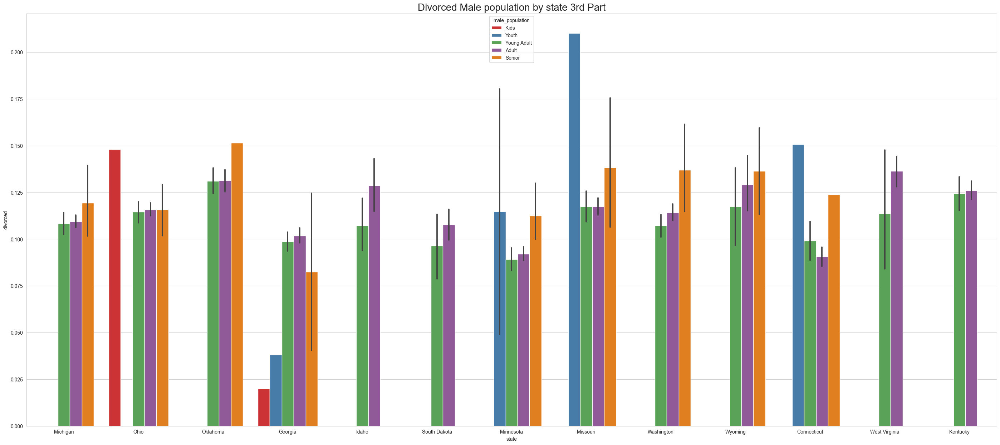

In [117]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='male_population',data=train,palette="Set1",order=['Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota',
           'Missouri', 'Washington', 'Wyoming', 'Connecticut', 'West Virginia', 'Kentucky']).set_title('Divorced Male population by state 3rd Part', fontsize = 20)

plt.show()

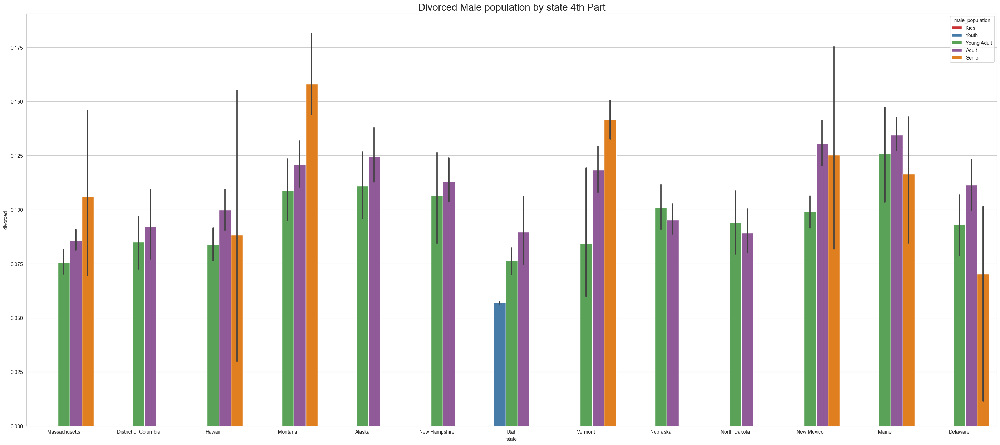

In [118]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='male_population',data=train,palette="Set1",order=['Massachusetts', 'District of Columbia', 'Hawaii', 'Montana', 'Alaska',
           'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 'New Mexico', 'Maine', 'Delaware']).set_title('Divorced Male population by state 4th Part', fontsize = 20)

plt.show()

- "Ohio", has Largest number of Divorced Male KIDS.
- "Missouri"&"Connecticut", has Largest number of Divorced Male YOUTH.
- "Maine, Indiana & Oklahoma", has Largest number of Divorced Male YOUNG ADULTS
- "Arkansas, Maine,Neveda ,Indiana & Oklahoma", has Largest number of Divorced Male ADULTS
- "Louisiana","OKlahoma" & "Montana", has Largest number of Divorced Male SENIORS.

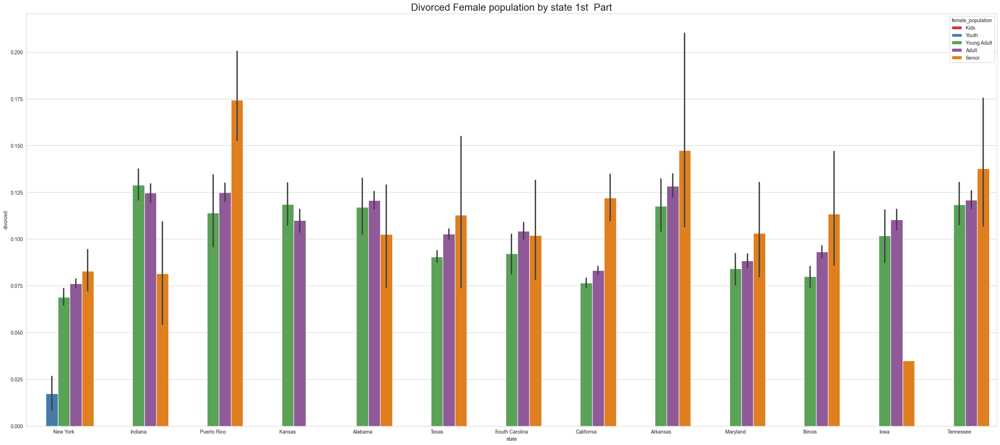

In [119]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='female_population',data=train,palette="Set1",order=['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas','South Carolina', 
       'California', 'Arkansas', 'Maryland', 'Illinois','Iowa', 'Tennessee',]).set_title('Divorced Female population by state 1st  Part', fontsize = 20)

plt.show()

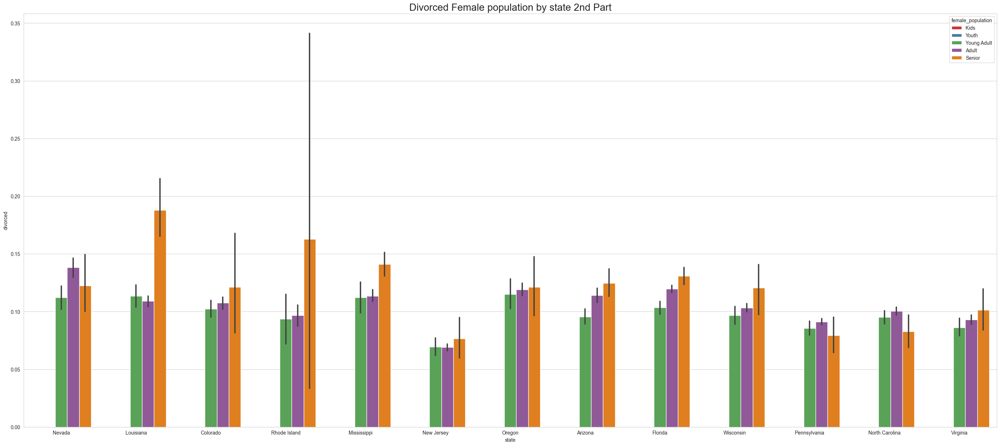

In [120]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='female_population',data=train,palette="Set1",order=['Nevada', 'Louisiana', 'Colorado','Rhode Island', 'Mississippi', 'New Jersey', 
       'Oregon', 'Arizona','Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina','Virginia']).set_title('Divorced Female population by state 2nd Part', fontsize = 20)

plt.show()

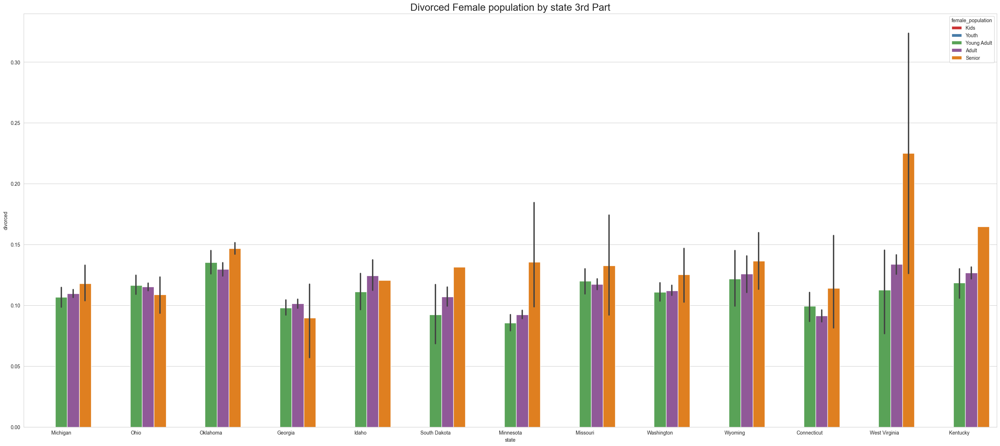

In [121]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='female_population',data=train,palette="Set1",order=['Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota',
           'Missouri', 'Washington', 'Wyoming', 'Connecticut', 'West Virginia', 'Kentucky']).set_title('Divorced Female population by state 3rd Part', fontsize = 20)

plt.show()

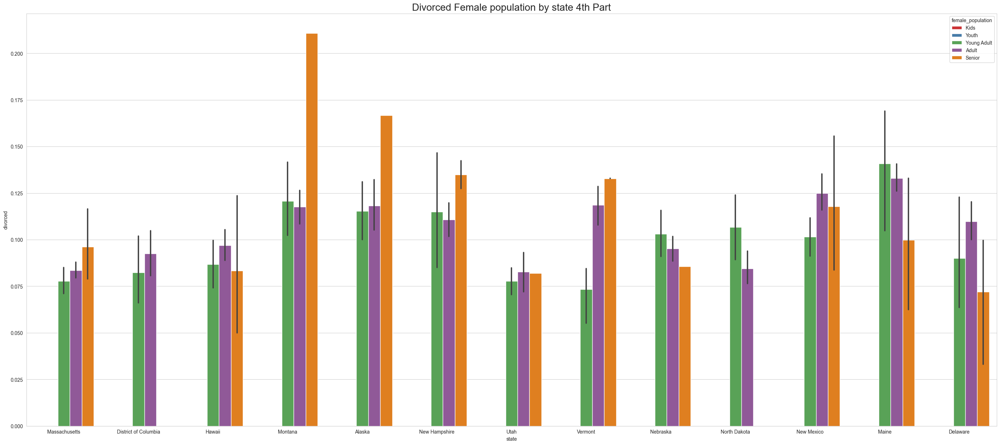

In [122]:
sns.set_style('whitegrid')
plt.figure(figsize=(35,15))
sns.barplot(x='state',y='divorced',hue='female_population',data=train,palette="Set1",order=['Massachusetts', 'District of Columbia', 'Hawaii', 'Montana', 'Alaska',
           'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 'New Mexico', 'Maine', 'Delaware']).set_title('Divorced Female population by state 4th Part', fontsize = 20)

plt.show()

- "Newyork", is the only state that has Divorced Female YOUTH.
- "Maine", has Largest number of Divorced Female YOUNG ADULTS
- "Maine", has Largest number of Divorced Female ADULTS
- "Montana", has Largest number of Divorced Female SENIORS.

Please detail your observations for rent as a percentage of income at an overall level, and for different states.

In [123]:
rent_income = train.groupby(by='state')['rent_mean'].agg(['mean'])
rent_income.head()

,mean
state,
Alabama,768.810406
Alaska,1173.830410
Arizona,1101.133798
Arkansas,715.367386
California,1479.363998


In [124]:
family_income = train.groupby(by='state')['family_mean'].agg(['mean'])
family_income.head()

,mean
state,
Alabama,66814.665178
Alaska,92504.826703
Arizona,73546.551858
Arkansas,64046.416919
California,88438.468548


In [125]:
rent_perc_of_income=round(rent_income['mean']/family_income['mean'],2)
rent_perc_of_income.head(10)

state
Alabama                 0.01
Alaska                  0.01
Arizona                 0.01
Arkansas                0.01
California              0.02
Colorado                0.01
Connecticut             0.01
Delaware                0.01
District of Columbia    0.01
Florida                 0.02
Name: mean, dtype: float64

In [126]:
#overall level rent as a percentage of income
round(sum(train['rent_mean'])/sum(train['family_mean'])*100,2)

1.33

Perform correlation analysis for all the relevant variables by creating a heatmap. Describe your findings.

In [127]:
train.columns

Index(['COUNTYID', 'STATEID', 'state', 'state_ab', 'city', 'place', 'type',
       'primary', 'zip_code', 'area_code', 'lat', 'lng', 'ALand', 'AWater',
       'pop', 'male_pop', 'female_pop', 'rent_mean', 'rent_median',
       'rent_stdev', 'rent_sample_weight', 'rent_samples', 'rent_gt_10',
       'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35',
       'rent_gt_40', 'rent_gt_50', 'universe_samples', 'used_samples',
       'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree_male', 

In [128]:
train.corr()

,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,bad_debt,remaining_income,pop_density,median_age
COUNTYID,1.000000,0.223287,0.036425,0.067072,-0.151533,0.070043,0.016090,0.017031,-0.000569,-0.000045,-0.001064,-0.101025,-0.098807,-0.093382,0.048407,-0.004591,-0.012977,-0.028583,-0.027498,-0.019562,-0.013346,-0.011231,-0.012661,-0.017261,-0.002112,-0.005648,-0.081554,-0.079876,-0.078903,0.033864,-0.003445,-0.078593,-0.076669,-0.065202,0.038421,-0.000958,-0.140820,-0.138465,-0.123860,0.039519,-0.025001,-0.093181,-0.092821,-0.056453,0.039904,0.055392,-0.041053,-0.050552,-0.137030,-0.089218,0.060584,0.150341,0.084777,-0.068022,-0.064961,-0.066098,-0.068323,-0.069007,-0.010542,0.003152,-0.000045,-0.060044,-0.058462,-0.001736,0.002970,-0.001064,-0.005662,-0.021103,0.044997,0.070471,0.049538,-0.138812,-0.001094,-0.080502,-0.066240
STATEID,0.223287,1.000000,-0.256752,0.041526,0.113640,0.315076,-0.016735,-0.026702,-0.033485,-0.035321,-0.030731,-0.218888,-0.213287,-0.161816,0.055482,-0.055277,-0.049668,-0.093912,-0.097669,-0.097030,-0.093942,-0.088322,-0.082602,-0.069986,-0.043719,-0.055833,-0.088322,-0.077650,-0.106192,0.033457,-0.000826,-0.073768,-0.063696,-0.098698,0.023716,-0.001674,-0.168790,-0.164789,-0.164438,0.052420,-0.020214,-0.015292,-0.007497,-0.060218,0.113807,0.111858,-0.112604,-0.124951,-0.153831,-0.167687,0.121704,0.162447,0.164158,0.014217,0.004236,0.023879,-0.024696,-0.020339,0.063380,-0.033347,-0.035321,-0.019499,-0.014456,0.070417,-0.028977,-0.030731,0.073730,0.029096,-0.030348,0.032507,0.018495,-0.159455,0.042556,-0.017781,-0.017752
zip_code,0.036425,-0.256752,1.000000,-0.005795,-0.066621,-0.927256,0.073090,0.032090,0.080324,0.097659,0.061090,0.072191,0.065121,0.038962,0.036003,0.071796,-0.007010,0.001015,-0.008332,-0.012694,-0.013553,-0.019356,-0.026066,-0.035668,0.066434,0.074013,0.001854,0.002074,-0.007979,0.018502,0.021548,-0.024399,-0.027873,-0.011084,0.060018,0.044422,-0.017347,-0.014659,-0.017293,-0.015256,0.003119,-0.219464,-0.222153,-0.093055,-0.061711,-0.017305,0.083010,0.077754,-0.079424,0.060807,-0.061424,0.087225,-0.071669,-0.083918,-0.066084,-0.095826,-0.108997,-0.110069,-0.063268,0.092835,0.097659,-0.143931,-0.139463,-0.059782,0.059036,0.061090,-0.073406,0.026660,0.021005,-0.050454,0.043390,-0.075752,-0.100912,-0.116082,-0.132190
area_code,0.067072,0.041526,-0.005795,1.000000,-0.125661,-0.012333,0.016342,0.022635,0.032716,0.035495,0.029063,0.043070,0.043159,0.007007,-0.046464,-0.026024,0.028616,0.028971,0.023347,0.016971,0.021730,0.012082,0.008261,-0.003806,-0.024660,-0.025234,0.017577,0.021174,0.001709,-0.011039,-0.003494,0.001511,0.001361,-0.004660,0.034203,0.034822,0.043388,0.041269,0.038626,-0.018005,0.016052,0.033448,0.033897,0.026035,0.004379,-0.000298,0.005227,0.003852,-0.002090,0.014255,0.002720,0.010127,-0.022758,-0.028772,-0.022153,-0.032577,-0.024674,-0.016547,-0.009461,0.037512,0.035495,-0.022033,-0.014146,-0.017580,0.027582,0.029063,0.016004,0.059046,0.030469,0.023231,-0.045801,-0.002423,-0.059233,-0.024700,-0.016388
lat,-0.151533,0.113640,-0.066621,-0.125661,1.000000,0.018561,0.101773,0.069589,-0.090787,-0.084619,-0.094200,-0.00

In [129]:
correlation=train[['COUNTYID','STATEID','zip_code','pop', 'family_mean','second_mortgage', 'home_equity', 'debt','hs_degree',
           'median_age','pct_own', 'married','separated', 'divorced']].corr()

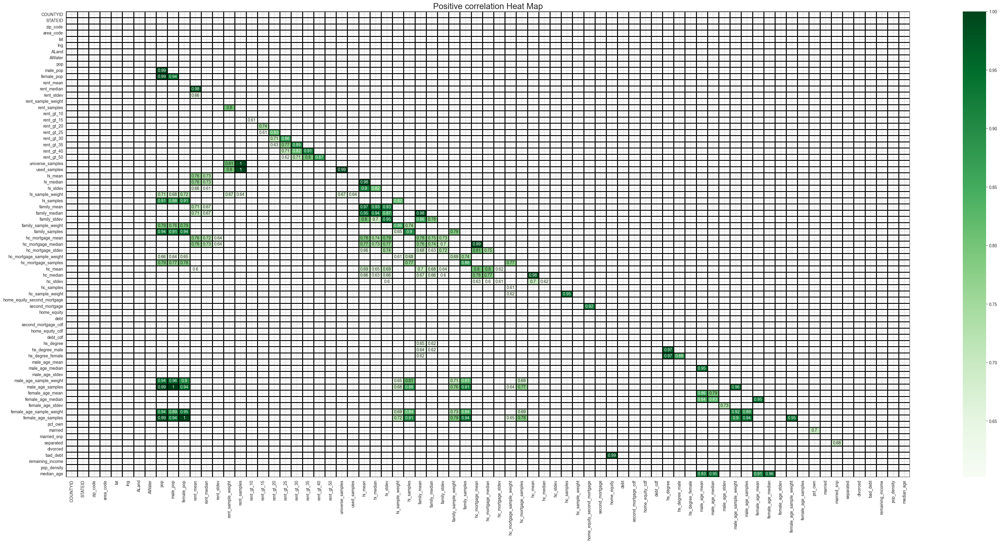

In [150]:
sns.set_style("whitegrid")

corr = train.corr()

mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

kot = corr[corr>=.6]
plt.figure(figsize=(45,20))
sns.heatmap(kot, cmap="Greens", annot = True, mask = mask, linewidths=1, linecolor='black').set_title('Positive correlation Heat Map', fontsize = 20)
plt.grid('on', )
plt.show()

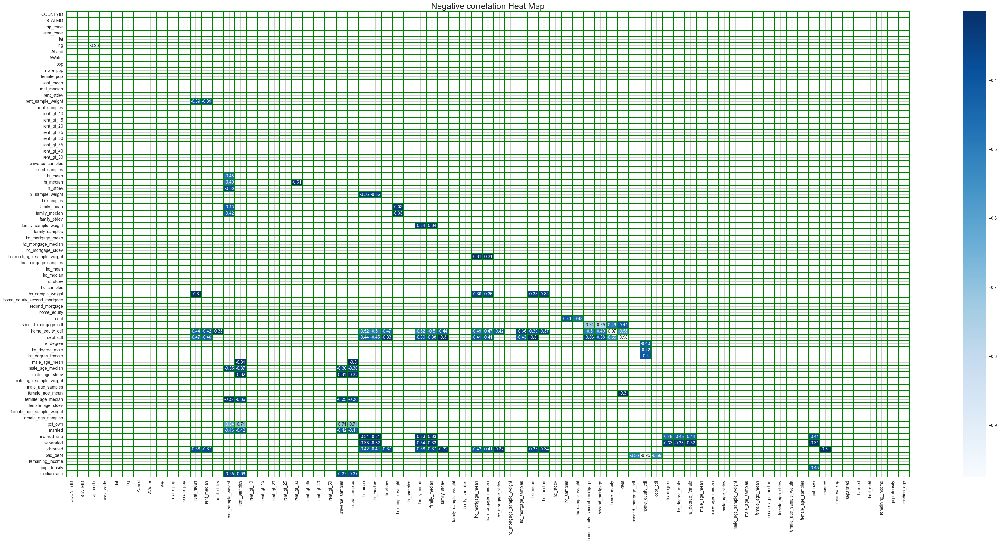

In [151]:
sns.set_style("whitegrid")
kot = corr[corr <=-.3]
plt.figure(figsize=(45,20))
sns.heatmap(kot, cmap="Blues", annot = True, mask = mask, linewidths=1, linecolor='green').set_title('Negative correlation Heat Map', fontsize = 20)
plt.grid('on', )
plt.show()

<Axes: >

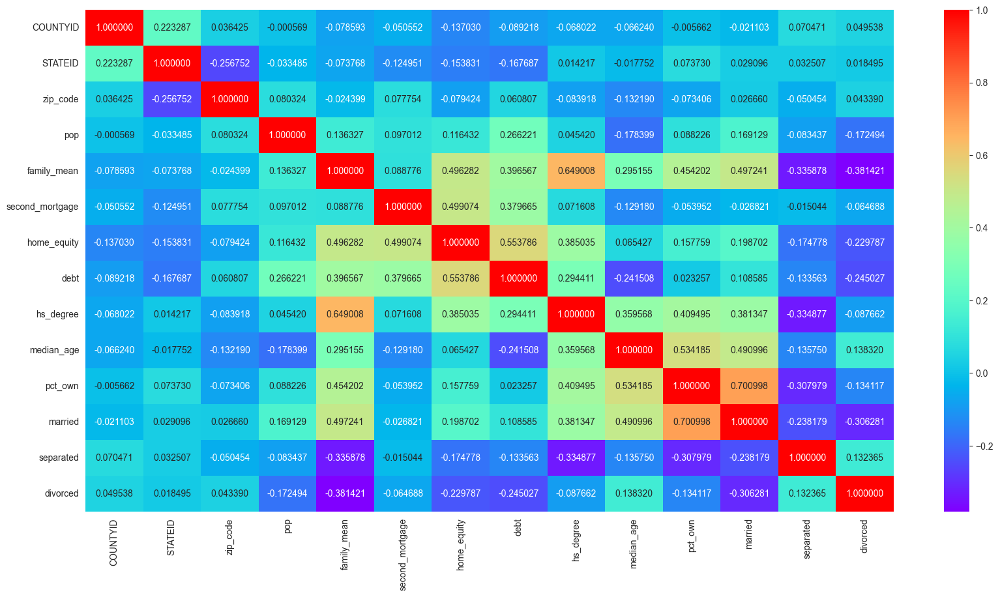

In [130]:
plt.figure(figsize=(20,10))
sns.heatmap(correlation,annot=True, fmt='f',  cmap=plt.cm.rainbow)

High positive correaltion is noticed between pop, male_pop and female_pop

High positive correaltion is noticed between rent_mean,hi_mean, family_mean,hc_mean



# Project Task: Week 3

### Data Pre-processing:

The economic multivariate data has a significant number of measured variables. The goal is to find where the measured variables depend on a number of smaller unobserved common factors or latent variables. 2. Each variable is assumed to be dependent upon a linear combination of the common factors, and the coefficients are known as loadings. Each measured variable also includes a component due to independent      random variability, known as “specific variance” because it is specific to one variable. Obtain the common factors and then plot the loadings. Use factor analysis to find latent variables in our dataset and gain          insight into the linear relationships in the data. Following are the list of latent variables:

• Highschool graduation rates

• Median population age

• Second mortgage statistics

• Percent own

• Bad debt expense

In [131]:
from factor_analyzer import FactorAnalyzer

In [132]:
def numerical_variable(data):
  numerical_variable = list(data.select_dtypes(include = ['int', 'float']).columns)
  return numerical_variable

In [133]:
numerical_variable(train)

['COUNTYID',
 'STATEID',
 'zip_code',
 'area_code',
 'lat',
 'lng',
 'ALand',
 'AWater',
 'pop',
 'male_pop',
 'female_pop',
 'rent_mean',
 'rent_median',
 'rent_stdev',
 'rent_sample_weight',
 'rent_samples',
 'rent_gt_10',
 'rent_gt_15',
 'rent_gt_20',
 'rent_gt_25',
 'rent_gt_30',
 'rent_gt_35',
 'rent_gt_40',
 'rent_gt_50',
 'universe_samples',
 'used_samples',
 'hi_mean',
 'hi_median',
 'hi_stdev',
 'hi_sample_weight',
 'hi_samples',
 'family_mean',
 'family_median',
 'family_stdev',
 'family_sample_weight',
 'family_samples',
 'hc_mortgage_mean',
 'hc_mortgage_median',
 'hc_mortgage_stdev',
 'hc_mortgage_sample_weight',
 'hc_mortgage_samples',
 'hc_mean',
 'hc_median',
 'hc_stdev',
 'hc_samples',
 'hc_sample_weight',
 'home_equity_second_mortgage',
 'second_mortgage',
 'home_equity',
 'debt',
 'second_mortgage_cdf',
 'home_equity_cdf',
 'debt_cdf',
 'hs_degree',
 'hs_degree_male',
 'hs_degree_female',
 'male_age_mean',
 'male_age_median',
 'male_age_stdev',
 'male_age_sample_weig

In [134]:
n_train = train[numerical_variable(train)]

In [135]:
n_train.isnull().any().sum()

0

In [136]:
n_train.head()

,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,bad_debt,remaining_income,pop_density,median_age
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,53,36,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770,0.09408,4868.86384,0.000026,44.667430
246444,141,18,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030,0.04274,8738.17744,0.001687,34.722748
245683,63,18,46122,317,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657,0.09512,10319.83114,0.000099,41.774472
279653,127,72,927,787,18.396103,-66.104169,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106,0.01086,7668.01017,0.002442,49.879012
247218,161,20,66502,785,39.195573,-96.569366,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096,1005.42886,1704.0,0.99286,0.98247,0.91688,0.84740,0.78247,0.60974,0.55455,0.44416,1725,1540,31834.15466,22497.0,34046.50907,1548.67477,1983.0,54053.42396,50272.0,39609.12605,244.08903,395.0,1192.58759,1125.0,327.49674,76.61052,134.0,443.68855,444.0,76.12674,124.0,79.55556,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.74967,1.00000,1.00000,1.00000,26.07533,22.41667

In [137]:
n_train.columns

Index(['COUNTYID', 'STATEID', 'zip_code', 'area_code', 'lat', 'lng', 'ALand',
       'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean', 'rent_median',
       'rent_stdev', 'rent_sample_weight', 'rent_samples', 'rent_gt_10',
       'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35',
       'rent_gt_40', 'rent_gt_50', 'universe_samples', 'used_samples',
       'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree_male', 'hs_degree_female', 'male_age_mean',
       'male_age_median', '

In [138]:
#exculde columns 
n_train.drop(columns=['COUNTYID', 'STATEID', 'zip_code', 'area_code', 'lat','lng','remaining_income', 'pop_density', 'median_age'],inplace=True)

In [139]:
n_train.head()

,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,bad_debt
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770,0.09408
246444,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030,0.04274
245683,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657,0.09512
279653,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106,0.01086
247218,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096,1005.42886,1704.0,0.99286,0.98247,0.91688,0.84740,0.78247,0.60974,0.55455,0.44416,1725,1540,31834.15466,22497.0,34046.50907,1548.67477,1983.0,54053.42396,50272.0,39609.12605,244.08903,395.0,1192.58759,1125.0,327.49674,76.61052,134.0,443.68855,444.0,76.12674,124.0,79.55556,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.74967,1.00000,1.00000,1.00000,26.07533,22.41667,11.84399,1296.89877,2586.0,24.17693,21.58333,11.10484,1854.48652,3051.0,0.13046,0.12356,0.00000,0.00000,0.03109,0.05426


In [140]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(n_train)
chi_square_value, p_value

(8959301.609000478, 0.0)

In [141]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(n_train)

In [142]:
kmo_model

0.21258179885028894

In [143]:
# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer(n_factors=5,rotation=None)
fa.fit(n_train)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
ev

array([ 1.57678238e+01,  1.22155718e+01,  8.26250989e+00,  4.58172663e+00,
        3.97519378e+00,  3.01600413e+00,  2.06024698e+00,  1.46559774e+00,
        1.34374021e+00,  1.25431970e+00,  1.12745750e+00,  9.61855242e-01,
        9.26584195e-01,  8.09338082e-01,  7.46960817e-01,  6.50289807e-01,
        5.85096676e-01,  5.67000356e-01,  5.19034761e-01,  4.59746569e-01,
        4.24790777e-01,  3.83072967e-01,  3.54797876e-01,  3.13372295e-01,
        3.04908411e-01,  2.55646006e-01,  2.44373229e-01,  2.37250283e-01,
        2.06382996e-01,  2.01625607e-01,  1.86066850e-01,  1.72524346e-01,
        1.52798366e-01,  1.41654101e-01,  1.32787334e-01,  1.16981644e-01,
        1.08400630e-01,  9.83265800e-02,  9.44036830e-02,  9.13910484e-02,
        8.98417270e-02,  5.82959043e-02,  5.07010306e-02,  4.11974098e-02,
        3.36265157e-02,  3.24731122e-02,  2.72260565e-02,  2.23657590e-02,
        2.11101652e-02,  1.91414406e-02,  1.60759720e-02,  1.54707466e-02,
        1.43342261e-02,  

In [144]:
load = fa.loadings_
load

array([[-4.27717059e-02, -4.54305626e-02, -1.13940775e-01,
        -3.91728133e-02,  4.37363732e-02],
       [-9.34046715e-03, -2.22582165e-02, -3.13959771e-02,
        -2.40646585e-02,  2.64331857e-02],
       [ 3.26432748e-01,  9.28257827e-01, -6.46486587e-02,
         3.89795021e-02,  1.67046036e-02],
       [ 3.18069898e-01,  9.03287406e-01, -6.31368153e-02,
         1.99749760e-02,  1.38052888e-02],
       [ 3.23886934e-01,  9.21117942e-01, -6.37530883e-02,
         5.60007969e-02,  1.87912130e-02],
       [ 7.41500877e-01, -8.54214512e-02,  3.33649251e-01,
         1.48215420e-01,  7.70206947e-02],
       [ 6.99629292e-01, -7.87175602e-02,  3.24351278e-01,
         1.33998931e-01,  5.77966186e-02],
       [ 5.66798428e-01, -7.29982979e-02,  2.58285212e-01,
         1.55797181e-01,  2.06444826e-01],
       [-4.00621051e-01,  4.90599589e-01,  2.44292835e-01,
        -1.99469007e-01,  2.83431001e-01],
       [-1.14653160e-01,  5.65887867e-01,  4.64443125e-01,
        -1.99537053e-01

In [145]:
xv= range(1, n_train.shape[1]+1)

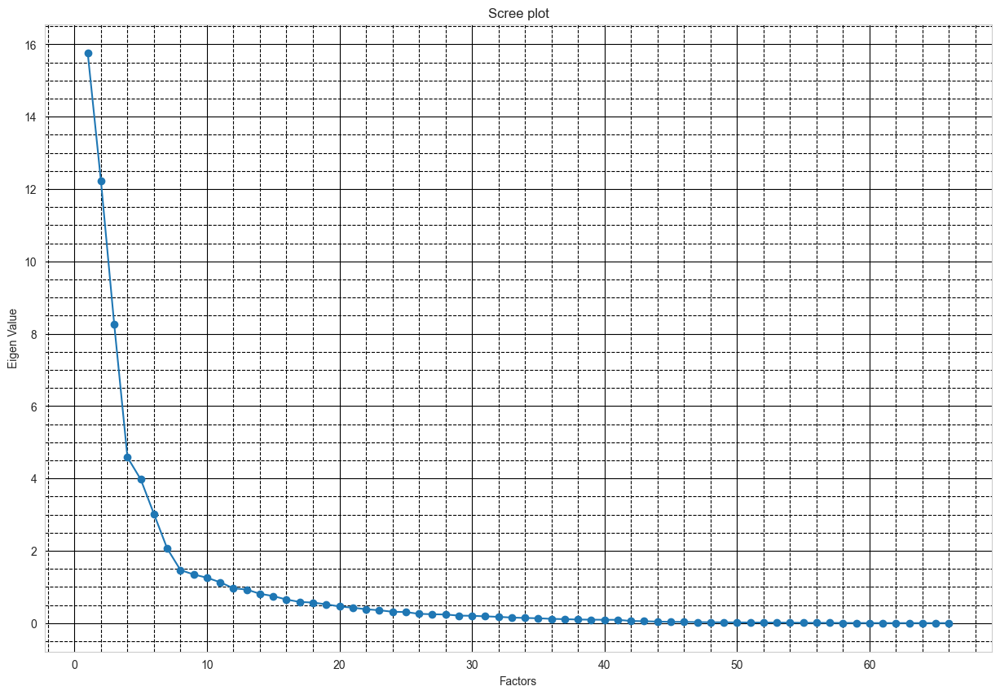

In [147]:
plt.figure(figsize = (15,10))
plt.scatter(xv, ev)
plt.plot(xv, ev)
plt.title('Scree plot')
plt.xlabel('Factors')
plt.ylabel('Eigen Value')
plt.grid(color = 'black', )
plt.grid(visible=True, which='minor', color='black', linestyle='--')
plt.minorticks_on()
plt.show()

In [168]:
from factor_analyzer import FactorAnalyzer
selected_vars = ['COUNTYID','STATEID','pop','male_pop','female_pop','rent_mean', 'hi_mean','family_mean','hc_mortgage_mean','hc_mean',
                 'home_equity_second_mortgage','second_mortgage','home_equity','debt','bad_debt','pct_own',
                 'second_mortgage_cdf','home_equity_cdf','debt_cdf','hs_degree','male_age_mean','female_age_mean','median_age','married']
relevant_vars = ['COUNTYID','STATEID','pop','male_pop','female_pop','pop_density','rent_mean', 'hi_mean','family_mean','hc_mortgage_mean','hc_mean',
                 'home_equity_second_mortgage','second_mortgage','home_equity','debt','second_mortgage_cdf','home_equity_cdf','debt_cdf',
                 'bad_debt','pct_own','hs_degree','male_age_mean','female_age_mean','median_age','married','separated','divorced']

- The problem deals with an economic multivariate data which has a signigicant number of measured variables. The goal is to find where the measured variables depend on a number of smaller unobserved common factors or latent variables. This method is used to drop factors with lowest amount of variance and to reduce the number of observed variables by associating them with infulential underlying factors. Each factor explains a particular amount of variance in the observed variables. It works by extracting maximum common variance from all variables and puts them into a common score.

- For these reasons, after removing 'ALand','AWater', 'pop_density', 'separated' and 'divorced' from initial 86 variables based on correlation analysis, Exploratory Factor Analysis is utilized to continue to reduce the number of features and extract a lower number of more influential features. This is also to explore the common factors representing groups of "squared" correlated areas as can be sepcified in the Figure 8.

In [169]:
#Adequacy Test - factorability of the dataset
from factor_analyzer.factor_analyzer import calculate_kmo, calculate_bartlett_sphericity
kmo_all, kmo_model = calculate_kmo(df_combined[selected_vars])
print(kmo_model)

0.7949214865155864


- Adequecy Test is fistly implemented to evaluate if more influential factors could be found from the concerning dataset.
- In this problem, Kaiser-Meyer-Olkin (KMO) Test is used to measure the suitability of observable variables for factor analysis by calculating the variance proportion among all the initial variables. The model's output ranges from 0 to 1. Therefore, the closer to 1, the more adequate the problem is for factor analysis.
- The overall KMO for this problem is 0.75 which is a high measurement to support the method of adequacy for the selected dataset.

In [170]:
# Choosing the number of Factors

fa = FactorAnalyzer(n_factors=len(relevant_vars),rotation=None) # Create factor analysis object 
fa.fit(df_combined[selected_vars]) # Perform factor analysis #.select_dtypes(exclude= ('object','category'))
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
ev

array([ 7.55548867e+00,  4.42299999e+00,  2.88200644e+00,  2.25733586e+00,
        1.27815681e+00,  1.04492553e+00,  9.20854431e-01,  8.05811685e-01,
        6.91120565e-01,  5.60760965e-01,  3.40516096e-01,  3.00828594e-01,
        2.32078988e-01,  1.86589803e-01,  1.36750196e-01,  1.12879697e-01,
        9.58753386e-02,  5.63972425e-02,  4.30864208e-02,  3.31051689e-02,
        2.25005619e-02,  1.99309463e-02,  1.43231002e-16, -7.12220311e-16])

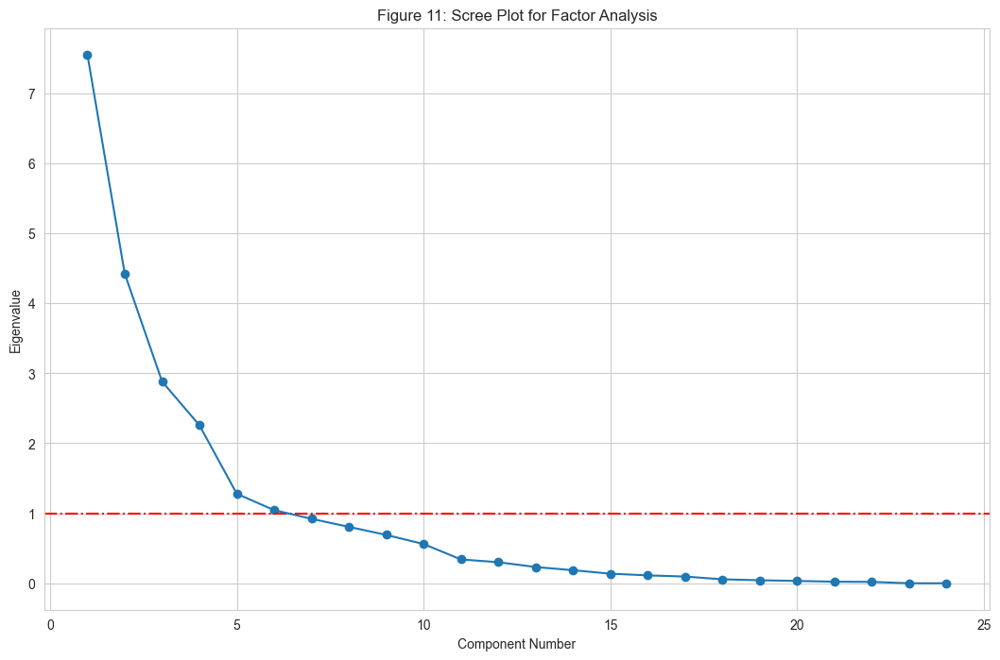

In [171]:
plt.figure(figsize=(12.9, 8))
component_num = [i+1 for i in range(len(ev))]
plt.axhline(y = 1, color = 'r', linestyle = '-.')
plt.plot(component_num, ev)
plt.scatter(component_num, ev)
plt.xlabel('Component Number')
plt.ylabel('Eigenvalue')
plt.title('Figure 11: Scree Plot for Factor Analysis')
plt.show()

In [173]:
Fa = pd.DataFrame.from_records(load)

Fa = Fa.add_prefix('Factor_Analysis')

Fa.index = n_train.columns
Fa

,Factor_Analysis0,Factor_Analysis1,Factor_Analysis2,Factor_Analysis3,Factor_Analysis4
ALand,-0.042772,-0.045431,-0.113941,-0.039173,0.043736
AWater,-0.009340,-0.022258,-0.031396,-0.024065,0.026433
pop,0.326433,0.928258,-0.064649,0.038980,0.016705
male_pop,0.318070,0.903287,-0.063137,0.019975,0.013805
female_pop,0.323887,0.921118,-0.063753,0.056001,0.018791
rent_mean,0.741501,-0.085421,0.333649,0.148215,0.077021
rent_median,0.699629,-0.078718,0.324351,0.133999,0.057797
rent_stdev,0.566798,-0.072998,0.258285,0.155797,0.206445
rent_sample_weight,-0.400621,0.490600,0.244293,-0.199469,0.283431
rent_samples,-0.114653,0.565888,0.464443,-0.199537,0.407303


# Highschool graduation rates
                         • Median population age
                         • Second mortgage statistics
                         • Percent own
                         • Bad debt expense

In [174]:
Fa_train = round(Fa.loc[['hs_degree', 'hs_degree_male', 'hs_degree_female',"male_age_median", "female_age_median", "home_equity_second_mortgage", 
'second_mortgage', 'second_mortgage_cdf', 'pct_own', 'bad_debt'], :], 2)

In [175]:
def col_elements(value):

#Colors elements in a dateframe green if positive and red if negative


  if value < -0.5:
    color = 'red'
  elif value > 0.5:
    color = 'green'
  else:
    color = 'black'

  return 'color: %s' % color

In [179]:
Fa_train.style.applymap(col_elements)

ImportError: Pandas requires version '3.0.0' or newer of 'jinja2' (version '2.10.3' currently installed).

# Project Task: Week 4

### Data Modeling :

Build a linear Regression model to predict the total monthly expenditure for home mortgages loan. Please refer ‘deplotment_RE.xlsx’. Column hc_mortgage_mean is predicted variable. This is the mean monthly     mortgage and owner costs of specified geographical location. Note: Exclude loans from prediction model which have NaN (Not a Number) values for hc_mortgage_mean.

In [232]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, SCORERS

As analysed in correlation and factor analysis, Linear Regression is projected to be applied to capture and learn the linear relations of the dependent selected variables and independent one of Mean Monthly Mortgage & Owner Costs.

In [182]:
df_train_selected = train[selected_vars]
df_test_selected = test[selected_vars]
y_train = df_train_selected['hc_mortgage_mean']
X_train = df_train_selected.drop('hc_mortgage_mean', axis=1)
y_test = df_test_selected['hc_mortgage_mean']
X_test = df_test_selected.drop('hc_mortgage_mean', axis=1)
#scaler = StandardScaler()
#X_train = scaler.fit_transform(X_train)
#X_test = scaler.fit_transform(X_test)
model = LinearRegression()
model.fit(X_train, y_train)
print('Coefficient of Determination of Linear Regression Model: {:.3f}'.format(model.score(X_test, y_test)))

Coefficient of Determination of Linear Regression Model: 0.836


- Coefficient of Determination, a statistical measure in a regression model that determines the proportion of variance in the independant variable that can be explained by the dependant ones, is used to evaluate the performance of the Linear Regression model in predicting the target feature.
- As can be seen, a significantly high percentage with approximately 83.6% of the independant variable ('hc_second_mortgage') is predicted by dependent ones.

In [184]:
y_pred = model.predict(X_test)
rmse_lr = np.sqrt(mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error of the Linear Regression model: {:.2f} USD over the overall average of {:.2f} USD'
      .format(rmse_lr, np.mean(y_train)))

Root Mean Squared Error of the Linear Regression model: 255.64 USD over the overall average of 1627.90 USD


- The Root Mean Squared Error is selected to evaluate the margin of deviation between the ground truth and the predicted value. Since their difference is squared, the outliers' influence is also taken into account.
- As can be seen in Figure 9, the calculated RMSE value from y_pred and y_train of 255.80 USD is strongly skewed leftward compared to the wide main distribution from around 500 to 4000 USD. For this pattern, the mean predicted price for a specific geographic location has a considerably high probability to be closed to the desired actual value.

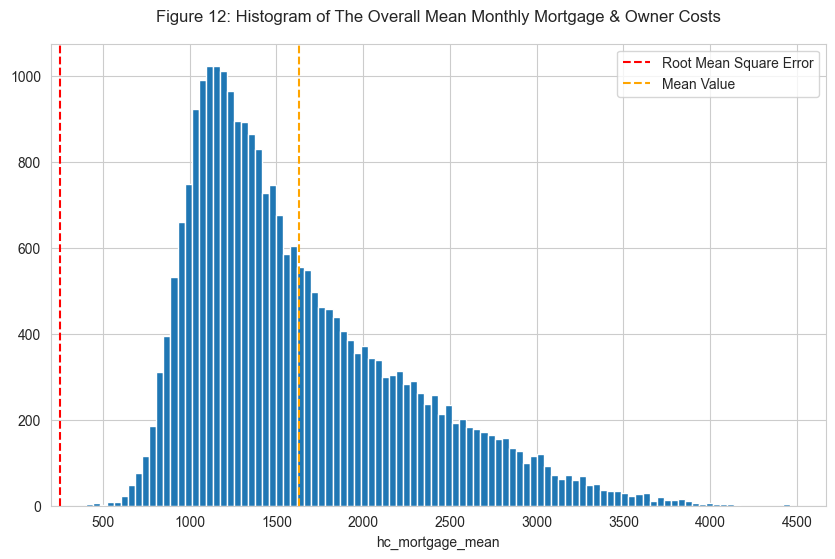

In [185]:
plt.figure(figsize=(10,6))
y_train.hist(bins=100)
plt.axvline(x=rmse_lr, color = 'r', linestyle = '--', label='Root Mean Square Error')
plt.axvline(x=np.mean(y_train), color = 'orange', linestyle = '--', label='Mean Value')
plt.title('Figure 12: Histogram of The Overall Mean Monthly Mortgage & Owner Costs', y=1.03)
plt.xlabel('hc_mortgage_mean')
plt.legend()
plt.show()

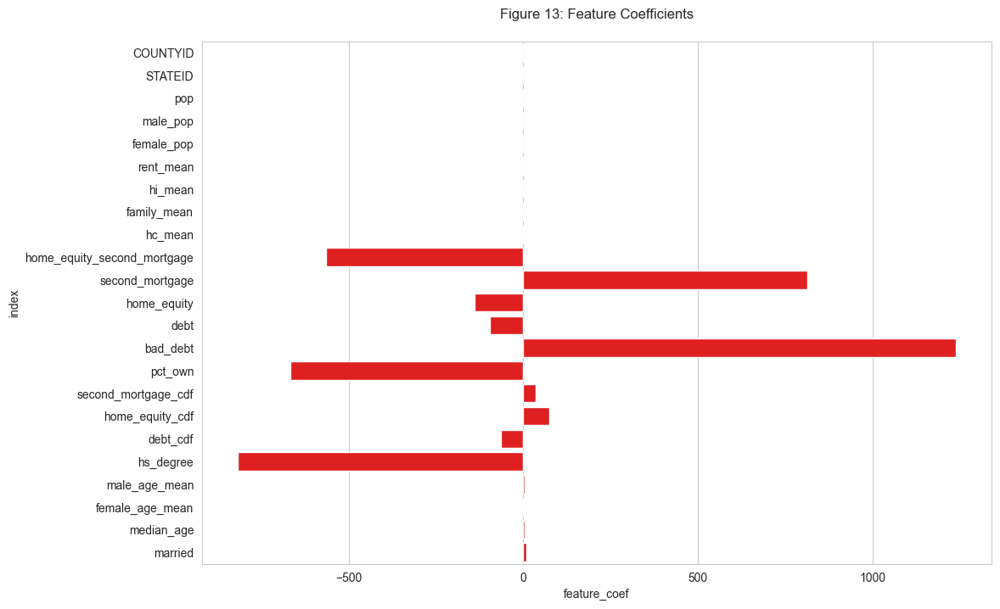

In [186]:
feat_importance_df = pd.DataFrame(model.coef_ , columns=['feature_coef'], index=X_train.columns).reset_index()
plt.figure(figsize=(12,8))
sns.barplot(data=feat_importance_df, x='feature_coef', y='index', color='red')
plt.title("Figure 13: Feature Coefficients", y=1.03)
plt.show()

- The figure of feature importance shows that there are only 6 features, which plays important roles in estimating the Mean Monthly Mortgage and Owner Costs, including second mortgage statistics ('home_equity_second_mortgage', 'second_mortgage', 'home_equity'), bad debt ('bad_debt'), percent own ('pct_own') and percent high school degree ('hs_degree').
- These are the measures in proportion and require high coefficients to be able to match with high scale of predicted price.

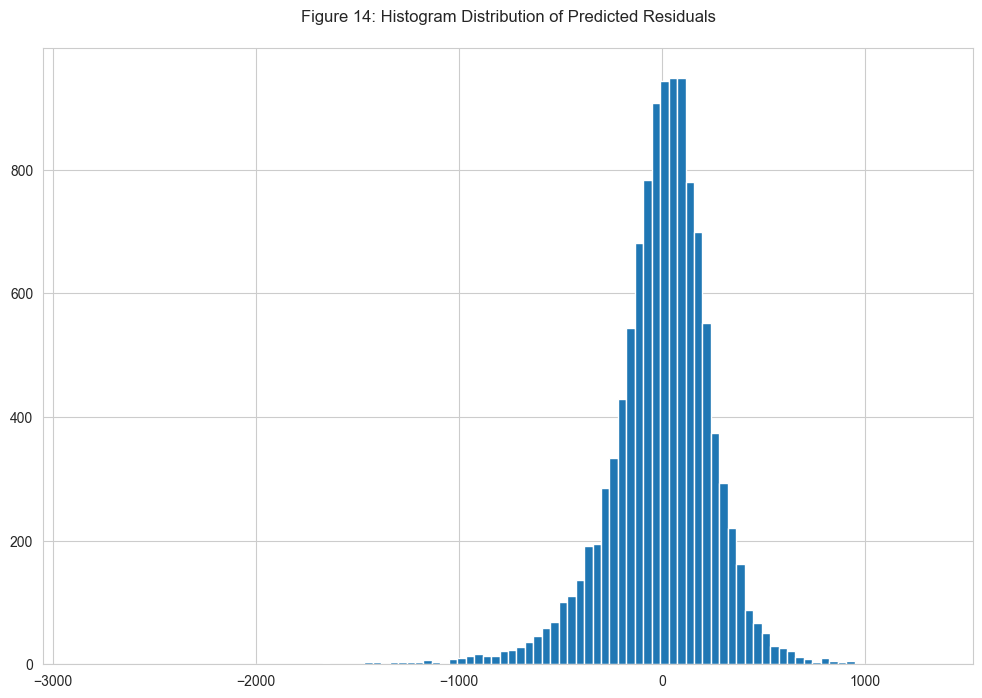

In [187]:
residuals = y_pred - y_test
plt.figure(figsize=(12,8))
plt.hist(residuals, bins=100)
plt.title('Figure 14: Histogram Distribution of Predicted Residuals', y=1.03)
plt.show()

As can be seen, residuals of the predicted Monthly Second Mortgage and Owner Costs follow a Normal Distribution and are mainly allocated around -250 to 250 USD, which demonstrates a highly low deviation in prediction of the trained model in the National scale.

In [189]:
train.groupby('state')['pop'].count().reset_index().sort_values(by='pop', ascending=False)

,state,pop
4,California,2826
44,Texas,1876
32,New York,1683
9,Florida,1569
38,Pennsylvania,1203
13,Illinois,1096
35,Ohio,1074
22,Michigan,1016
33,North Carolina,809
10,Georgia,757


Since there are various levels of count for each unique state and number of observations are highly important to ensure the performance of model, 2 representatives states for 3 categories of count will be selected to examine the prediction results of different types of states real estate distribution:

- 'Texas', 'New York' for high number of recordings (>1500)
- 'Massachusetts', 'Washington' for medium number of recordings (240~530)
- 'Hawaii', 'Vermont' for low number of recordings (<120)

In [191]:
dict_states = {'high':['Texas', 'New York'],
               'medium': ['Washington','Nevada'],
               'low':['Hawaii', 'Vermont']}

dict_results = {'high':[], 'medium':[], 'low':[]}

def model_state(state):
    df_train_selected = train[train['state']==state][selected_vars]
    df_test_selected = test[test['state']==state][selected_vars]
    y_train = df_train_selected['hc_mortgage_mean']
    X_train = df_train_selected.drop('hc_mortgage_mean', axis=1)
    y_test = df_test_selected['hc_mortgage_mean']
    X_test = df_test_selected.drop('hc_mortgage_mean', axis=1)
    model = LinearRegression()
    model.fit(X_train, y_train)
    return model.score(X_test, y_test)

for type, state in dict_states.items():
    for t in state:
        dict_results[type].append(model_state(t))
pd.DataFrame(dict_results, index=[i for i in range(2)])

,high,medium,low
0,0.869274,0.875964,0.618417
1,0.741108,0.782703,0.472723


As can be seen, there is no large difference in the significantly high performance (from 0.75 to 0.86 r2 Score) of high and medium type even for 'Nevada' with 239 observations. However, the performance falls below 0.61 starting from about 113 recordings of Hawaii.

In [192]:
n_test = test[numerical_variable(test)]

In [193]:
#exculde columns 
n_test.drop(columns=['COUNTYID', 'STATEID', 'zip_code', 'area_code', 'lat','lng','pop_density', 'median_age'],inplace=True)

In [194]:
print(n_train.shape)
print(n_test.shape)

(26585, 66)
(11355, 66)


In [195]:
n_train.columns

Index(['ALand', 'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples',
       'rent_gt_10', 'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30',
       'rent_gt_35', 'rent_gt_40', 'rent_gt_50', 'universe_samples',
       'used_samples', 'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight',
       'hi_samples', 'family_mean', 'family_median', 'family_stdev',
       'family_sample_weight', 'family_samples', 'hc_mortgage_mean',
       'hc_mortgage_median', 'hc_mortgage_stdev', 'hc_mortgage_sample_weight',
       'hc_mortgage_samples', 'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples',
       'hc_sample_weight', 'home_equity_second_mortgage', 'second_mortgage',
       'home_equity', 'debt', 'second_mortgage_cdf', 'home_equity_cdf',
       'debt_cdf', 'hs_degree', 'hs_degree_male', 'hs_degree_female',
       'male_age_mean', 'male_age_median', 'male_age_stdev',
       'male_age_sample_weight', 'male_age_samples',

In [196]:
n_test.columns

Index(['ALand', 'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples',
       'rent_gt_10', 'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30',
       'rent_gt_35', 'rent_gt_40', 'rent_gt_50', 'universe_samples',
       'used_samples', 'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight',
       'hi_samples', 'family_mean', 'family_median', 'family_stdev',
       'family_sample_weight', 'family_samples', 'hc_mortgage_mean',
       'hc_mortgage_median', 'hc_mortgage_stdev', 'hc_mortgage_sample_weight',
       'hc_mortgage_samples', 'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples',
       'hc_sample_weight', 'home_equity_second_mortgage', 'second_mortgage',
       'home_equity', 'debt', 'second_mortgage_cdf', 'home_equity_cdf',
       'debt_cdf', 'hs_degree', 'hs_degree_male', 'hs_degree_female',
       'male_age_mean', 'male_age_median', 'male_age_stdev',
       'male_age_sample_weight', 'male_age_samples',

a) Run a model at a Nation level. If the accuracy levels and R square are not satisfactory proceed to below step.

In [197]:
train_x = n_train.drop(columns=['hc_mortgage_mean'])
train_y = n_train['hc_mortgage_mean']

In [198]:
test_x = n_test.drop(columns=['hc_mortgage_mean'])
test_y = n_test['hc_mortgage_mean']

In [199]:
print(train_x.shape)
print(test_x.shape)

(26585, 65)
(11355, 65)


In [200]:
Lr = LinearRegression()

In [201]:
Lr.fit(train_x,train_y)

LinearRegression()

In [202]:
predict= Lr.predict(test_x)
predict

array([1141.74980398, 1511.1676771 , 1222.02059302, ..., 1854.09448016,
       1157.18297104, 1387.37036565])

In [205]:
mae = mean_absolute_error(test_y,predict)
mse = mean_squared_error(test_y,predict)
rmse = math.sqrt(mean_squared_error(test_y,predict))
r2 = r2_score(test_y,predict)
print(f"Mean Absolute Error:{round(mae,2)}")
print(f"Mean Squared Error:{round(mse,2)}")
print(f"Root Mean Squared Error:{round(rmse,2)}")
print(f"R2 Score:{round(r2,2)}")

Mean Absolute Error:43.67
Mean Squared Error:4673.49
Root Mean Squared Error:68.36
R2 Score:0.99


Regression Model with all dependent numeric variables at Nation level is giving R SQUARED metric of 99%. So skipping state level Regression Model

b) Run another model at State level. There are 52 states in USA

In [206]:
s_train = train[numerical_variable(train)]
s_test =  test[numerical_variable(test)]

In [207]:
s_train.drop(columns=['zip_code', 'area_code', 'lat','lng','remaining_income', 'pop_density', 'median_age'],inplace=True)
s_test.drop(columns=['zip_code', 'area_code', 'lat','lng','pop_density', 'median_age'],inplace=True)

In [208]:
print(s_train.shape)
print(s_test.shape)

(26585, 68)
(11355, 68)


In [209]:
state = s_train['STATEID'].unique()

In [210]:
s_train['STATEID'].value_counts()

6     2826
48    1876
36    1683
12    1569
42    1203
17    1096
39    1074
26    1016
37     809
13     757
34     684
51     667
18     565
25     538
53     536
55     531
4      523
24     513
47     508
27     496
29     488
8      463
22     420
1      407
45     389
21     387
40     365
9      321
41     321
72     300
20     295
19     287
5      264
28     242
32     239
49     224
35     195
31     185
54     168
23     130
30     117
15     113
33     111
16     101
46      89
44      89
38      79
2       74
10      71
11      63
50      62
56      56
Name: STATEID, dtype: int64

In [211]:
print(sorted(state))

[1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 72]


In [212]:
s_train.columns

Index(['COUNTYID', 'STATEID', 'ALand', 'AWater', 'pop', 'male_pop',
       'female_pop', 'rent_mean', 'rent_median', 'rent_stdev',
       'rent_sample_weight', 'rent_samples', 'rent_gt_10', 'rent_gt_15',
       'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35', 'rent_gt_40',
       'rent_gt_50', 'universe_samples', 'used_samples', 'hi_mean',
       'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree_male', 'hs_degree_female', 'male_age_mean',
       'male_age_median', 'male_age_stdev', 'male_age_sample_weigh

In [213]:
feature_columns=['COUNTYID', 'STATEID', 'ALand', 'AWater', 'pop', 'male_pop',
       'female_pop', 'rent_mean', 'rent_median', 'rent_stdev',
       'rent_sample_weight', 'rent_samples', 'rent_gt_10', 'rent_gt_15',
       'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35', 'rent_gt_40',
       'rent_gt_50', 'universe_samples', 'used_samples', 'hi_mean',
       'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_median','hc_mortgage_stdev', 'hc_mortgage_sample_weight',
       'hc_mortgage_samples','hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree_male', 'hs_degree_female', 'male_age_mean',
       'male_age_median', 'male_age_stdev', 'male_age_sample_weight',
       'male_age_samples', 'female_age_mean', 'female_age_median',
       'female_age_stdev', 'female_age_sample_weight', 'female_age_samples',
       'pct_own', 'married', 'married_snp', 'separated', 'divorced',
       'bad_debt']

In [214]:
from sklearn.preprocessing import StandardScaler

In [215]:
SC = StandardScaler()

In [216]:
for i in [1,20,45]:
  print("STATEID -",i)
  s_train_x=s_train[s_train['COUNTYID']==i][feature_columns]
  s_train_y=s_train[s_train['COUNTYID']==i]['hc_mortgage_mean']
    
  s_test_x=s_test[s_test['COUNTYID']==i][feature_columns]
  s_test_y=s_test[s_test['COUNTYID']==i]['hc_mortgage_mean']
    
  s_train_scaled=SC.fit_transform(s_train_x)
  s_test_scaled=SC.fit_transform(s_test_x)

  Lr.fit(s_train_scaled,s_train_y)
  s_pred = Lr.predict(s_test_scaled)
  
  s_mae = mean_absolute_error(s_test_y,s_pred)
  s_mse = mean_squared_error(s_test_y,s_pred)
  s_rmse = math.sqrt(mean_squared_error(s_test_y,s_pred))
  s_r2 = r2_score(s_test_y,s_pred)

  print(f"Mean Absolute Error:{round(s_mae,2)}")
  print(f"Mean Squared Error:{round(s_mse,2)}")
  print(f"Root Mean Squared Error:{round(s_rmse,2)}")
  print(f"R2 Score:{round(s_r2,2)}")

STATEID - 1
Mean Absolute Error:4888608501350.01
Mean Squared Error:4.3766797165205065e+25
Root Mean Squared Error:6615647902148.74
R2 Score:-8.591190110563726e+19
STATEID - 20
Mean Absolute Error:246.6
Mean Squared Error:84714.13
Root Mean Squared Error:291.06
R2 Score:0.63
STATEID - 45
Mean Absolute Error:13696626240347.87
Mean Squared Error:3.0532393678404985e+26
Root Mean Squared Error:17473521018502.53
R2 Score:-1.2662523147673375e+21


• Ensure Multi-collinearity does not exist in dependent variables

In [217]:
corr_features = set()
corr_mat = n_train.drop('hc_mortgage_mean', axis=1).corr()

for i in range(len(corr_mat.columns)):
    for j in range(i):
        if abs(corr_mat.iloc[i, j]) > 0.8:
            col_name = corr_mat.columns[i]
            corr_features.add(col_name)

In [218]:
corr_features

{'bad_debt',
 'debt_cdf',
 'family_mean',
 'family_median',
 'family_sample_weight',
 'family_samples',
 'family_stdev',
 'female_age_mean',
 'female_age_median',
 'female_age_sample_weight',
 'female_age_samples',
 'female_pop',
 'hc_median',
 'hc_mortgage_samples',
 'hc_sample_weight',
 'hi_median',
 'hi_samples',
 'hi_stdev',
 'home_equity_cdf',
 'hs_degree_female',
 'hs_degree_male',
 'male_age_median',
 'male_age_sample_weight',
 'male_age_samples',
 'male_pop',
 'rent_gt_25',
 'rent_gt_30',
 'rent_gt_35',
 'rent_gt_40',
 'rent_gt_50',
 'rent_median',
 'rent_samples',
 'second_mortgage',
 'universe_samples',
 'used_samples'}

In [219]:
corr_list = ['bad_debt','debt_cdf','family_mean','family_median','family_sample_weight','family_samples','family_stdev','female_age_mean','female_age_median','female_age_sample_weight',
 'female_age_samples','female_pop','hc_median','hc_mortgage_samples','hc_sample_weight','hi_median','hi_samples','hi_stdev','home_equity_cdf','hs_degree_female','hs_degree_male',
 'male_age_median','male_age_sample_weight','male_age_samples','male_pop','rent_gt_25','rent_gt_30','rent_gt_35','rent_gt_40','rent_gt_50','rent_median','rent_samples',
 'second_mortgage','universe_samples','used_samples']

In [220]:
n_train.drop(corr_list, axis=1, inplace=True)

In [221]:
n_test.drop(corr_list, axis=1, inplace=True)

In [222]:
print(n_train.shape, n_test.shape)

(26585, 31) (11355, 31)


# Dropped MultiCollinear variables and ran the Regression Model

In [223]:
n_train.head()

,ALand,AWater,pop,rent_mean,rent_stdev,rent_sample_weight,rent_gt_10,rent_gt_15,rent_gt_20,hi_mean,hi_sample_weight,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mean,hc_stdev,hc_samples,home_equity_second_mortgage,home_equity,debt,second_mortgage_cdf,hs_degree,male_age_mean,male_age_stdev,female_age_stdev,pct_own,married,married_snp,separated,divorced
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,202183361.0,1699120,5230,769.38638,232.63967,272.34441,0.86761,0.79155,0.59155,63125.28406,1290.96240,1414.80295,1223.0,641.22898,377.83135,570.01530,270.11299,770.0,0.01588,0.08919,0.52963,0.43658,0.89288,42.48574,22.97306,22.51276,0.79046,0.57851,0.01882,0.01240,0.08770
246444,1560828.0,100363,2633,804.87924,253.46747,312.58622,0.97410,0.93227,0.69920,41931.92593,838.74664,864.41390,784.0,482.27020,316.88320,351.98293,125.40457,229.0,0.02222,0.04274,0.60855,0.42174,0.90487,34.84728,20.37452,23.43353,0.52483,0.34886,0.01426,0.01426,0.09030
245683,69561595.0,284193,6881,742.77365,323.39011,291.85520,0.95238,0.88624,0.79630,84942.68317,1155.20980,1506.06758,1361.0,731.89394,699.41354,556.45986,184.42175,538.0,0.00000,0.09512,0.73484,1.00000,0.94288,39.38154,22.89769,23.94119,0.85331,0.64745,0.02830,0.01607,0.10657
279653,1105793.0,0,2700,803.42018,297.39258,259.30316,0.94693,0.87151,0.69832,48733.67116,928.32193,1175.28642,1101.0,428.98751,261.28471,288.04047,185.55887,392.0,0.01086,0.01086,0.52714,0.53057,0.91500,48.64749,23.05968,24.32015,0.65037,0.47257,0.02021,0.02021,0.10106
247218,2554403.0,0,5637,938.56493,392.44096,1005.42886,0.99286,0.98247,0.91688,31834.15466,1548.67477,1192.58759,1125.0,327.49674,76.61052,443.68855,76.12674,124.0,0.05426,0.05426,0.51938,0.18332,1.00000,26.07533,11.84399,11.10484,0.13046,0.12356,0.00000,0.00000,0.03109


In [224]:
train_X = n_train.drop(columns=['hc_mortgage_mean'])
train_Y = n_train['hc_mortgage_mean']

test_X = n_test.drop(columns=['hc_mortgage_mean'])
test_Y = n_test['hc_mortgage_mean']

In [225]:
Lr.fit(train_X,train_Y)

LinearRegression()

In [226]:
y_pred = Lr.predict(test_X)
y_pred

array([1146.05812417, 1511.21532648, 1224.05002978, ..., 1846.89314756,
       1166.22357821, 1388.02844867])

In [227]:
n_mae = mean_absolute_error(test_Y,y_pred)
n_mse = mean_squared_error(test_Y,y_pred)
n_rmse = math.sqrt(mean_squared_error(test_Y,y_pred))
n_r2 = r2_score(test_Y,y_pred)
print(f"Mean Absolute Error:{round(n_mae,2)}")
print(f"Mean Squared Error:{round(n_mse,2)}")
print(f"Root Mean Squared Error:{round(n_rmse,2)}")
print(f"R2 Score:{round(n_r2,2)}")

Mean Absolute Error:44.0
Mean Squared Error:4787.23
Root Mean Squared Error:69.19
R2 Score:0.99



# We have achieved an R Squared value of 99% which is pretty close to 1


• Test if predicted variable is normally distributed

In [228]:
residual = test_Y - y_pred
residual

UID
255504      -6.812644
252676      22.044554
276314      30.494590
248614     -78.423430
286865       8.275276
238666       4.135431
240174      11.796707
266241     -44.265031
224873     -49.241696
290904      38.112548
243894      39.372085
249869     -15.990594
252569     -11.469165
289758       6.883624
265375      -2.377305
282536      21.882346
291282      31.373245
228479      76.953234
234207       9.420985
221773      -9.871131
250775     -35.231303
221579      49.945929
282302      13.824565
224946     -15.516089
293442      12.370279
240520      62.051402
265215      40.940737
281686     -66.082313
285948     -36.556975
258792     -25.763980
220502     -45.105171
258985     -48.357005
273508     -49.776142
276405      33.678663
284366      -4.822987
224534     -98.769147
246101     -82.400449
240403     -33.719314
259449      19.412706
243106     -26.743362
275231     -91.634767
262923      42.691556
242365     -62.567103
263028      45.741530
266907     -83.067416
271383

<Axes: xlabel='hc_mortgage_mean', ylabel='Density'>

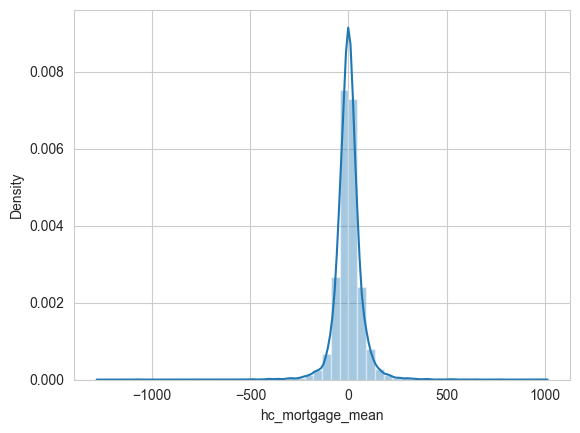

In [229]:
sns.distplot(residual)

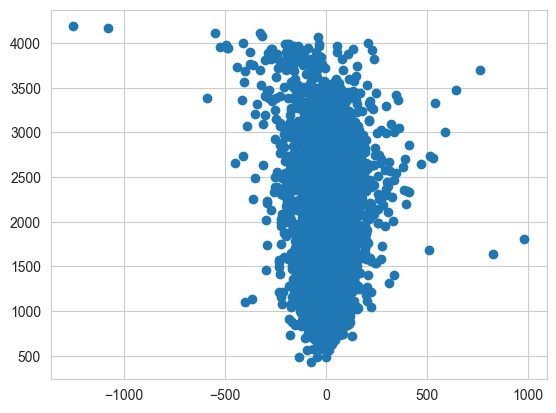

In [230]:
# Same variance and residuals does not have correlation with predictor and Independance of residuals
plt.scatter(residual,y_pred)

In [233]:
sorted(SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'matthews_corrcoef',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_negative_likelihood_ratio',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'positive_likelihood_ratio',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',

[5576, 4446, 3405, 4629, 6080, 3657, 7120, 4672, 8596, 5687, 8821, 5453, 9694, 9945, 1272, 10258, 5702, 8877, 8951, 565, 8867, 8436, 4582, 11040, 2446, 5, 8122, 9478, 2969, 9679, 8843, 11269, 5218, 3906, 9311, 866, 2945, 1975, 5188, 2980, 4773, 6049, 2903, 1616, 7126, 8308, 1089, 2996, 4685, 2085, 10649, 7895, 2047, 475, 1604, 8536, 8367, 6790, 6705, 6955, 265, 4417, 10233, 8097, 2529, 3185, 8910, 9294, 8522, 10362, 235, 10505, 5522, 4719, 4933, 8468, 1741, 4451, 7487, 9412, 5305, 10656, 5915, 4783, 9315, 5189, 1701, 8720, 6011, 1657, 10955, 557, 10598, 2784, 6615, 1627, 3221, 8040, 1564, 4366]
5576 [4110.1902494] 3784.76544
4446 [2041.13797507] 2131.13496
3405 [986.76539853] 995.80699
4629 [2045.26004865] 2052.33381
6080 [1163.32939174] 1136.8745
3657 [1465.16217614] 1434.41764
7120 [2747.92358394] 2866.48009
4672 [1238.00714257] 1183.79638
8596 [1336.04097746] 1321.66521
5687 [3151.70898927] 3074.23567
8821 [1795.36037546] 1798.37713
5453 [1076.99495786] 1052.45629
9694 [3065.5058741

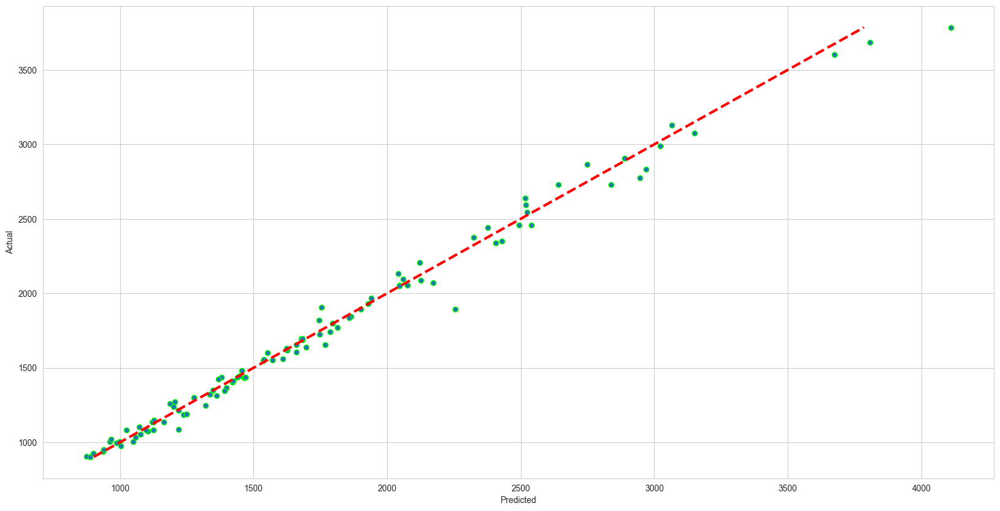

In [237]:
import random
randomlist = []
for i in range(0,100):
    n = random.randint(1,len(test))
    randomlist.append(n)
print(randomlist)

pre_out = []
out = []

for i in randomlist:
    data_in = [list(test_X.iloc[i])]
    # print(data_in)
    pre_data_out = Lr.predict(data_in)
    data_out = test_y.iloc[i]
    
    print(i, pre_data_out, data_out)
    
    pre_out.append(pre_data_out)
    out.append(data_out)

print(pre_out)

fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(pre_out, out, edgecolors=(0, 1, 0))
ax.plot([min(out), max(out)], [min(out), max(out)], 'r--', lw=3)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.show()